# 데이터 불러오기 및 패키지 설치

In [1]:
!pip install -q hvplot

In [2]:
!pip install chart-studio

Defaulting to user installation because normal site-packages is not writeable


In [3]:
!pip install imblearn

Defaulting to user installation because normal site-packages is not writeable


In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
from scipy import stats 
import matplotlib.pyplot as plt
import hvplot.pandas


from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler

from sklearn.metrics import (
    accuracy_score, confusion_matrix, classification_report, 
    roc_auc_score, roc_curve, auc,
    plot_confusion_matrix, plot_roc_curve
)
from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay

#from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization 
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import AUC
import chart_studio.plotly as py

# Plotting options
%matplotlib inline
#mpl.style.use('ggplot')
sns.set(style='whitegrid')

In [5]:
# For oversampling Library (Dealing with Imbalanced Datasets)
from imblearn.over_sampling import SMOTE
from collections import Counter
import time

In [6]:
df = pd.read_csv("lending club_train.csv", encoding='cp949')
pd.set_option('display.float', '{:.2f}'.format)
pd.set_option('display.max_columns', 50)
pd.set_option('display.max_rows', 50)

In [7]:
df.head(10)

,Unnamed: 0,index,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,...,mths_since_recent_bc_dlq8,mths_since_recent_bc_dlq9,mths_since_recent_bc_dlq10,mths_since_recent_bc_dlq11,mths_since_recent_inq1,mths_since_recent_inq2,mths_since_recent_inq3,mths_since_recent_inq4,mths_since_recent_inq5,mths_since_recent_inq6,mths_since_recent_inq7,mths_since_recent_inq8,mths_since_recent_inq9,mths_since_recent_inq10,mths_since_recent_revol_delinq1,mths_since_recent_revol_delinq2,mths_since_recent_revol_delinq3,mths_since_recent_revol_delinq4,mths_since_recent_revol_delinq5,mths_since_recent_revol_delinq6,mths_since_recent_revol_delinq7,mths_since_recent_revol_delinq8,mths_since_recent_revol_delinq9,mths_since_recent_revol_delinq10,mths_since_recent_revol_delinq11
0,1,1027571.00,12000,12000,12000.00,0.08,375.43,90641.00,10.20,0,690,694,1,5,0,5673,0.41,20,0.00,0.00,9735.81,9735.81,5646.56,1127.76,0.00,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,2,46603.00,14000,14000,14000.00,0.11,461.47,46000.00,17.40,1,670,674,0,9,0,10285,0.66,18,0.00,0.00,16376.89,16376.89,14000.00,2376.89,0.00,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,3,40908.00,24000,24000,24000.00,0.11,791.09,90000.00,11.73,2,660,664,0,6,0,18989,0.47,10,0.00,0.00,28435.24,28435.24,24000.00,4435.24,0.00,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,4,182450.00,14000,14000,14000.00,0.09,448.40,115000.00,7.31,0,660,664,1,16,0,16451,0.40,22,0.00,0.00,16034.23,16034.23,14000.00,2034.23,0.00,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,5,868323.00,14000,14000,14000.00,0.10,451.68,78000.00,24.32,0,685,689,2,17,0,25930,0.53,30,0.00,0.00,14954.26,14954.26,14000.00,954.26,0.00,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
5,6,484000.00,16800,16800,16800.00,0.21,459.14,56000.00,23.21,0,660,664,1,8,0,12161,0.94,15,0.00,0.00,19674.76,19674.76,16800.00,2874.76,0.00,...,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
6,7,188263.00,18000,18000,18000.00,0.09,568.97,112000.00,16.29,0,740,744,0,18,0,19907,0.57,20,0.00,0.00,20517.14,20517.14,18000.00,2517.14,0.00,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
7,8,47601.00,20000,20000,20000.00,0.12,664.20,91620.00,16.11,0,690,694,0,10,1,8835,0.32,32,0.00,0.00,23101.97,23101.97,20000.00,3101.97,0.00,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
8,9,987334.00,25000,25000,25000.00,0.12,833.83,120000.00,23.34,0,685,689,0,17,0,30849,0.86,29,0.00,0.00,8863.95,8863.95,4170.93,1648.81,0.00,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
9,10,194495.00,8000,8000,8000.00,0.13,268.75,83000.00,9.09,1,660,664,1,11,0,7151,0.54,12,0.00,0.00,9666.19,9666.19,8000.00,1666.19,0.00,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [8]:
pd.set_option('display.max_rows', 200)
df_dictionary = pd.read_excel('LCDataDictionary_번역.xlsx')
df_dictionary

,LoanStatNew,Description
0,acc_now_delinq,대출자가 현재 연체 중인 계정 수입니다.
1,acc_open_past_24mths,지난 24개월 동안 개설된 거래의 수.
2,addr_state,대출 신청서에서 대출자가 제공한 상태
3,all_util,모든 거래의 신용 한도에 대한 잔액
4,annual_inc,등록 중 대출자가 제공한 자체 신고 연소득입니다.
...,...,...
275,Debt-To-Income Ratio,주택담보대출과 LC대출을 제외한 총 채무에 대한 대출자의 월 총부채상환액을 이용하여...
276,Zip Code,대출 신청서에서 대출자가 제공한 우편 번호의 처음 3개.
277,State,대출 신청서에서 대출자가 제공한 상태
278,Employment Length,고용 기간(년)입니다. 가능한 값은 0과 10 사이입니다. 여기서 0은 1년 미만을...


In [9]:
real_df_dictionary = pd.read_excel('Data_column_번역.xlsx')
real_df_dictionary.head(36)

,loan_amnt,대출자가 신청한 대출의 나열된 금액입니다. 어느 시점에서 신용부가 대출금액을 줄이면 이 가치에 반영된다.
0,funded_amnt,그 시점에 그 대출에 약속된 총 금액.
1,funded_amnt_inv,그 시점에 투자자들이 해당 대출에 대해 약속한 총 금액입니다.
2,int_rate,대출이자율
3,installment,대출이 시작된 경우 대출자가 매달 지불해야 하는 금액입니다.
4,annual_inc,등록 중 대출자가 제공한 자체 신고 연소득입니다.
5,dti,주택담보대출과 LC대출을 제외한 총 채무에 대한 대출자의 월 총부채상환액을 이용하여...
6,delinq_2yrs,지난 2년간 대출자의 신용 파일에서 연체된 30일 이상의 건수
7,fico_range_low,대출 발생 시 대출자의 FICO가 속하는 하한 범위입니다.
8,fico_range_high,대출 발생 시 대출자의 FICO가 속하는 상한 범위입니다.
9,inq_last_6mths,최근 6개월간 조회건수(자동차 및 주택담보대출 조회 제외)


# EDA
- 어떤 변수가 중요한지 이해하고, 요약 통계량을 보고, 데이터를 시각화합니다.

In [10]:
df.describe()
#요약통계량 보기

,Unnamed: 0,index,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,...,mths_since_recent_bc_dlq8,mths_since_recent_bc_dlq9,mths_since_recent_bc_dlq10,mths_since_recent_bc_dlq11,mths_since_recent_inq1,mths_since_recent_inq2,mths_since_recent_inq3,mths_since_recent_inq4,mths_since_recent_inq5,mths_since_recent_inq6,mths_since_recent_inq7,mths_since_recent_inq8,mths_since_recent_inq9,mths_since_recent_inq10,mths_since_recent_revol_delinq1,mths_since_recent_revol_delinq2,mths_since_recent_revol_delinq3,mths_since_recent_revol_delinq4,mths_since_recent_revol_delinq5,mths_since_recent_revol_delinq6,mths_since_recent_revol_delinq7,mths_since_recent_revol_delinq8,mths_since_recent_revol_delinq9,mths_since_recent_revol_delinq10,mths_since_recent_revol_delinq11
count,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,...,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00,874335.00
mean,437168.00,546258.23,13644.57,13644.54,13638.59,0.13,431.21,75667.43,18.18,0.34,694.28,698.28,0.64,11.58,0.23,16325.43,0.53,24.73,0.16,0.16,14883.90,14877.44,12212.45,2466.75,1.81,...,0.02,0.03,0.02,0.02,0.11,0.18,0.15,0.07,0.06,0.10,0.08,0.09,0.08,0.08,0.64,0.04,0.04,0.04,0.03,0.03,0.04,0.04,0.03,0.04,0.03
std,252398.92,315438.64,8441.70,8441.67,8438.56,0.04,265.22,94931.18,8.32,0.91,30.62,30.62,0.93,5.43,0.64,22591.33,0.24,11.86,16.13,16.13,10291.91,10288.13,8515.91,2677.31,13.46,...,0.15,0.16,0.16,0.16,0.31,0.38,0.36,0.25,0.24,0.30,0.27,0.29,0.27,0.27,0.48,0.19,0.19,0.19,0.18,0.18,0.19,0.19,0.18,0.19,0.18
min,1.00,0.00,1000.00,1000.00,775.00,0.05,14.01,3000.00,0.00,0.00,660.00,664.00,0.00,1.00,0.00,0.00,0.00,2.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,218584.50,273011.50,7100.00,7100.00,7100.00,0.09,236.76,45000.00,11.91,0.00,670.00,674.00,0.00,8.00,0.00,6051.00,0.35,16.00,0.00,0.00,7063.38,7060.89,5750.00,859.17,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,437168.00,546303.00,12000.00,12000.00,11950.00,0.12,362.76,64000.00,17.67,0.00,685.00,689.00,0.00,11.00,0.00,11133.00,0.53,23.00,0.00,0.00,12040.48,12034.22,10000.00,1614.02,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
75%,655751.50,819460.50,19000.00,19000.00,19000.00,0.15,573.03,90000.00,24.09,0.00,710.00,714.00,1.00,14.00,0.00,19744.00,0.71,31.00,0.00,0.00,20437.79,20427.98,16900.00,2992.61,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
max,874335.00,1092916.00,40000.00,40000.00,40000.00,0.31,1715.42,61000000.00,49.96,30.00,845.00,850.00,8.00,90.00,86.00,2568995.00,8.92,176.00,4577.48,4577.48,63551.09,63551.09,40000.00,28499.14,1598.52,...,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 874335 entries, 0 to 874334
Columns: 335 entries, Unnamed: 0 to mths_since_recent_revol_delinq11
dtypes: float64(18), int64(317)
memory usage: 2.2 GB


In [12]:
# Replace the name of some columns
df = df.rename(columns={"loan_amnt": "loan_amount", "funded_amnt": "funded_amount", "funded_amnt_inv": "investor_funds",
                       "int_rate": "interest_rate", "annual_inc": "annual_income"})

# Drop irrelevant columns
#df.drop([''], axis=1, inplace=True)

#쓸모 없는 변수들은 Drop시켜줄 예정

## 대출금액 분포 살펴보기

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

Text(0.5, 1.0, 'Total committed by Investors')

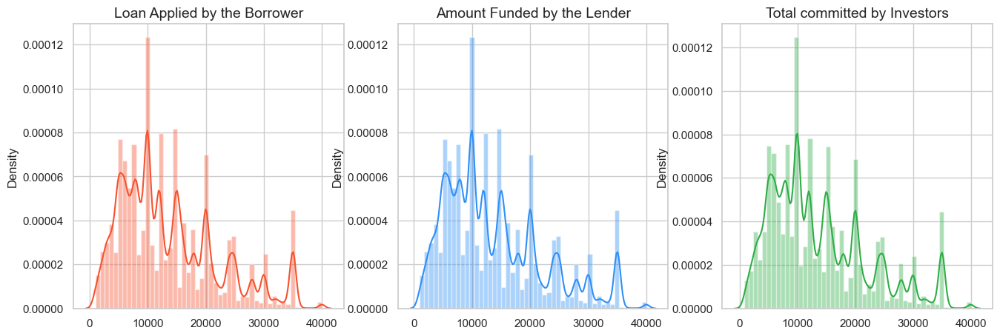

In [13]:
#대부분 대출자에게 발행된 금액
fig, ax = plt.subplots(1, 3, figsize=(16,5))


loan_amount = df["loan_amount"].values
funded_amount = df["funded_amount"].values
investor_funds = df["investor_funds"].values


sns.distplot(loan_amount, ax=ax[0], color="#F7522F")
ax[0].set_title("Loan Applied by the Borrower", fontsize=14)
sns.distplot(funded_amount, ax=ax[1], color="#2F8FF7")
ax[1].set_title("Amount Funded by the Lender", fontsize=14)
sns.distplot(investor_funds, ax=ax[2], color="#2EAD46")
ax[2].set_title("Total committed by Investors", fontsize=14)

### 현재까지 받은 원금, 이자, 연체금액 분포 보기

- 연체금액은 얼마나 돌려받을 수 있는지 ->  Risk 확인
- 이자로의 수익률과 원금의 회전율 확인

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

Text(0.5, 1.0, 'Late fees received')

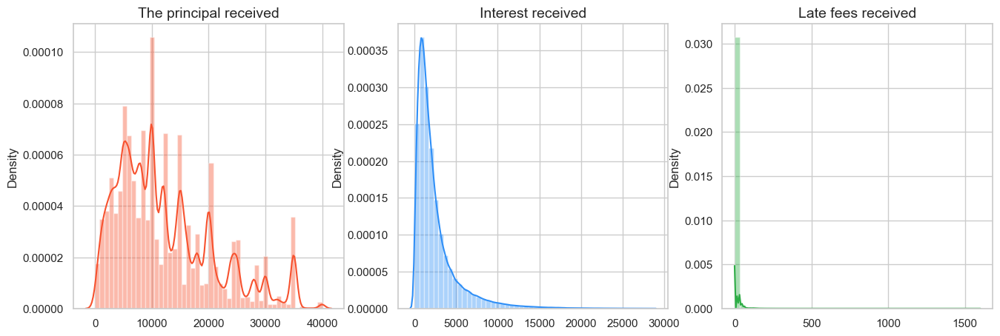

In [127]:
#현재까지 받은 원금, 이자, 연체 보기 
fig, ax = plt.subplots(1, 3, figsize=(16,5))


prncp_amount = df["total_rec_prncp"].values
int_amount = df["total_rec_int"].values
late_funds = df["total_rec_late_fee"].values


sns.distplot(prncp_amount, ax=ax[0], color="#F7522F")
ax[0].set_title("The principal received", fontsize=14)
sns.distplot(int_amount, ax=ax[1], color="#2F8FF7")
ax[1].set_title("Interest received", fontsize=14)
sns.distplot(late_funds, ax=ax[2], color="#2EAD46")
ax[2].set_title("Late fees received", fontsize=14)

## 변수들 간 상관관계 파악하기

In [15]:
corr_df = df.drop(df.columns[38:335], axis=1)
corr_df

,Unnamed: 0,index,loan_amount,funded_amount,investor_funds,interest_rate,installment,annual_income,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1,1027571.00,12000,12000,12000.00,0.08,375.43,90641.00,10.20,0,690,694,1,5,0,5673,0.41,20,0.00,0.00,9735.81,9735.81,5646.56,1127.76,0.00,2961.49,533.07,375.43,584,580,0,0,0,27898.00,0,0,0,0
1,2,46603.00,14000,14000,14000.00,0.11,461.47,46000.00,17.40,1,670,674,0,9,0,10285,0.66,18,0.00,0.00,16376.89,16376.89,14000.00,2376.89,0.00,0.00,0.00,4849.06,724,720,0,0,0,19286.00,0,0,0,0
2,3,40908.00,24000,24000,24000.00,0.11,791.09,90000.00,11.73,2,660,664,0,6,0,18989,0.47,10,0.00,0.00,28435.24,28435.24,24000.00,4435.24,0.00,0.00,0.00,14.56,684,680,0,0,0,324923.00,0,0,0,0
3,4,182450.00,14000,14000,14000.00,0.09,448.40,115000.00,7.31,0,660,664,1,16,0,16451,0.40,22,0.00,0.00,16034.23,16034.23,14000.00,2034.23,0.00,0.00,0.00,0.91,639,635,0,0,250,16451.00,0,0,0,0
4,5,868323.00,14000,14000,14000.00,0.10,451.68,78000.00,24.32,0,685,689,2,17,0,25930,0.53,30,0.00,0.00,14954.26,14954.26,14000.00,954.26,0.00,0.00,0.00,11769.19,709,705,0,0,0,105053.00,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
874330,874331,480114.00,32000,32000,32000.00,0.19,825.71,90000.00,27.39,0,735,739,0,14,0,91190,0.81,17,0.00,0.00,40999.67,40999.67,32000.00,8999.67,0.00,0.00,0.00,25311.18,699,695,0,0,0,182697.00,0,0,0,0
874331,874332,1027649.00,24000,24000,24000.00,0.07,740.18,76000.00,34.20,0,685,689,0,16,0,38338,0.84,24,0.00,0.00,26627.74,26627.74,24000.00,2627.74,0.00,0.00,0.00,739.89,664,660,0,0,320,69905.00,0,0,0,0
874332,874333,773937.00,4000,4000,4000.00,0.07,122.82,24960.00,25.29,0,790,794,2,15,0,3397,0.09,26,0.00,0.00,4361.03,4361.03,4000.00,361.03,0.00,0.00,0.00,1781.81,804,800,0,0,0,14190.00,0,0,0,0
874333,874334,87618.00,8000,8000,8000.00,0.13,269.09,53000.00,18.07,2,680,684,1,10,1,3304,0.37,24,0.00,0.00,8942.84,8942.84,8000.00,942.84,0.00,0.00,0.00,5988.57,624,620,0,0,0,20751.00,0,0,1,0


<AxesSubplot:>

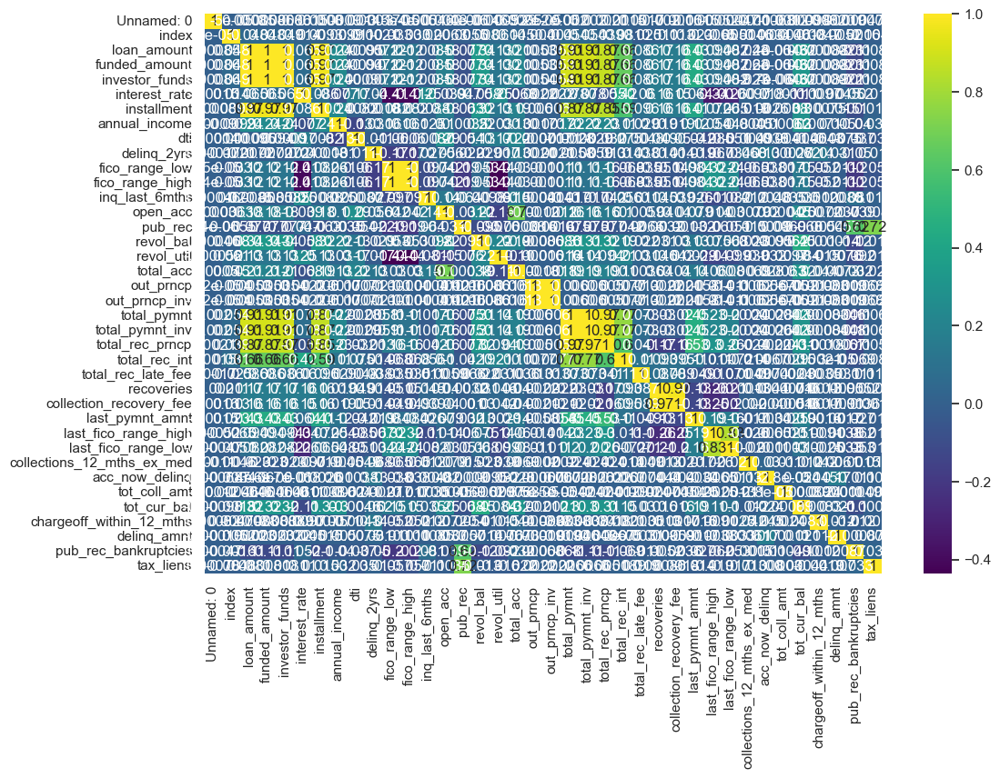

In [16]:
plt.figure(figsize=(12, 8))
sns.heatmap(corr_df.corr(), annot=True, cmap='viridis')

# 상관관계가 높으면 안쓰는게 좋다11

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


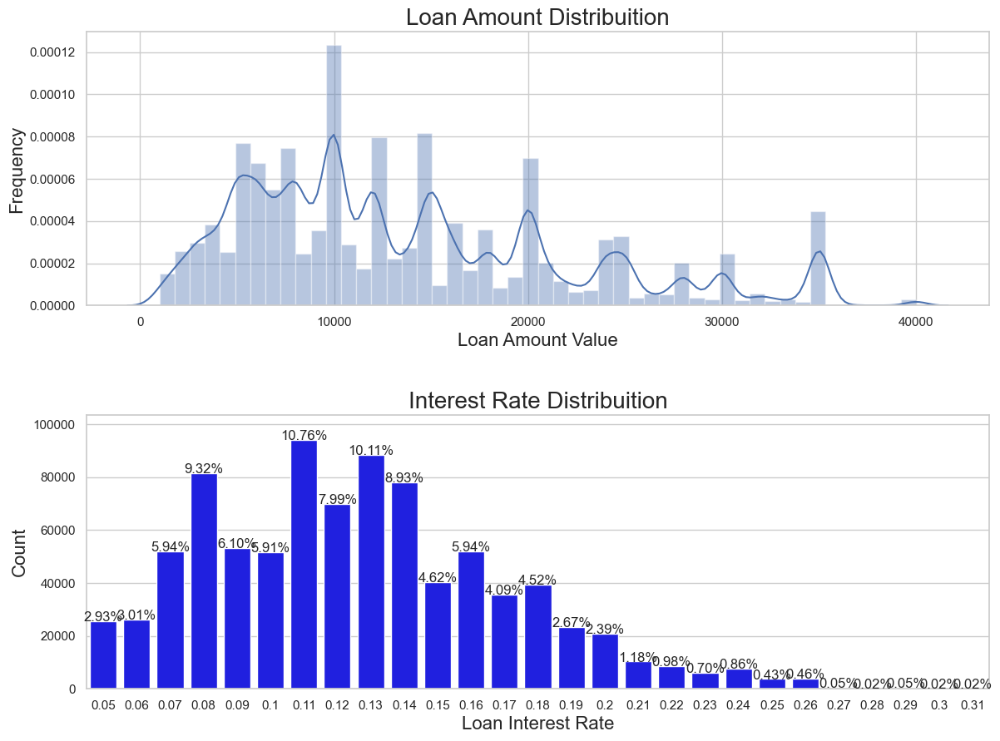

In [17]:
total = len(df)

df['int_round'] = df['interest_rate'].round(2).astype(float)
plt.figure(figsize=(14,10))

# 대출 총금액 PLOT
plt.subplot(211)
g = sns.distplot(df["loan_amount"])
g.set_xlabel("Loan Amount Value", fontsize=16)
g.set_ylabel("Frequency", fontsize=16)
g.set_title("Loan Amount Distribuition", fontsize=20)

# 이자율 PLOT
plt.subplot(212)
g1 = sns.countplot(x="int_round", data=df, 
                  color='blue')
g1.set_xlabel("Loan Interest Rate", fontsize=16)
g1.set_ylabel("Count", fontsize=16)
g1.set_title("Interest Rate Distribuition", fontsize=20)
sizes=[]
for p in g1.patches:
    height = p.get_height()
    sizes.append(height)
    g1.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center", fontsize=12) 
g1.set_ylim(0, max(sizes) * 1.10)

plt.subplots_adjust(hspace = 0.4,top = 0.9)

plt.show()

## 대출자 지불금액 살펴보기

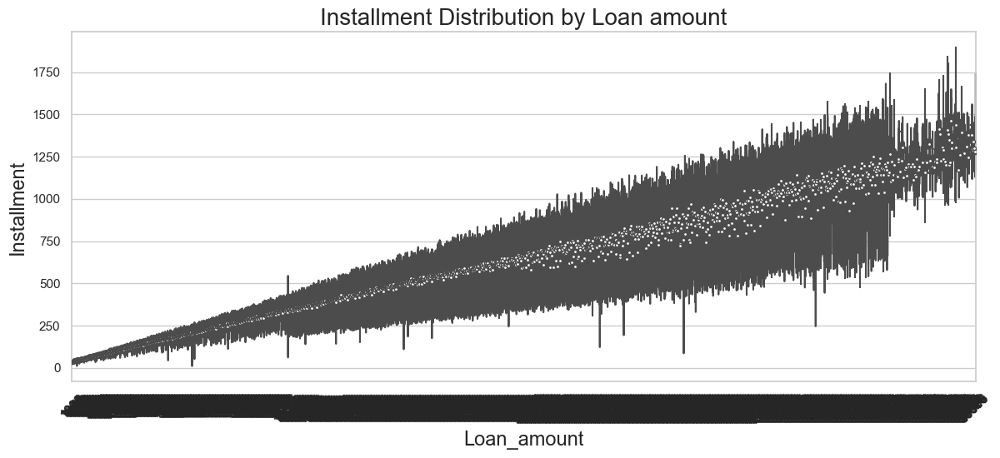

In [18]:
#대출자가 신청한 대출 금액 중 대출이 시작된 경우 대출자가 매달 지불해야 하는 금액

plt.figure(figsize = (14,12))

plt.subplot(211)
g = sns.violinplot(x='loan_amount', y="installment",
                   data=df, color='blue')
g.set_xticklabels(g.get_xticklabels(),rotation=45)
g.set_xlabel("Loan_amount", fontsize=17)
g.set_ylabel("Installment", fontsize=17)
g.set_title("Installment Distribution by Loan amount", fontsize=20)

plt.show()

## DTI 살펴보기

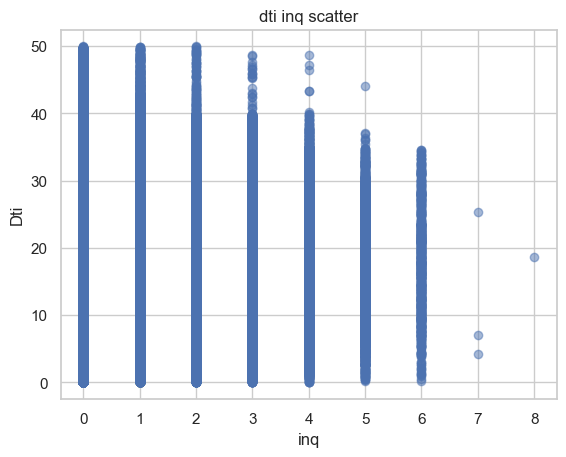

In [19]:
X = df.inq_last_6mths.values
Y = df.dti.values

import matplotlib.pyplot as plt
plt.scatter(X, Y, alpha=0.5)
plt.title('dti inq scatter')
plt.xlabel('inq')
plt.ylabel('Dti')
plt.show()

In [20]:
df.dti.value_counts()

19.20    675
14.40    669
18.00    648
16.80    625
15.60    622
        ... 
47.81      1
43.66      1
45.70      1
40.27      1
40.37      1
Name: dti, Length: 4726, dtype: int64

In [21]:
dti = df.hvplot.hist(
    y='dti', bins=50, width=350, height=350, 
    title="dti Distribution", xlabel='dti', ylabel='Count'
)

sub_dti = df[df['dti']<=50].hvplot.hist(
    y='dti', bins=50, width=350, height=350, 
    title="dti (<=30) Distribution", xlabel='dti', ylabel='Count', shared_axes=False
)

dti + sub_dti

:Layout
   .Histogram.I  :Histogram   [dti]   (dti_count)
   .Histogram.II :Histogram   [dti]   (dti_count)

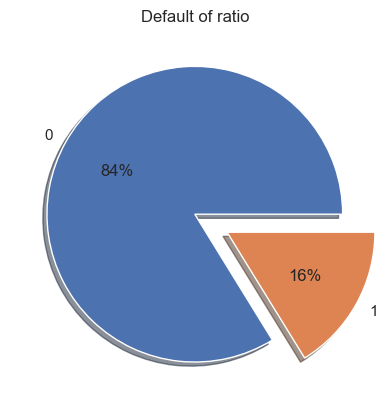

In [22]:
labels = df['depvar'].value_counts().index.tolist()
ratio = df['depvar'].value_counts().values.tolist()
explode = (0, 0.25) #조각이 갈라지는 것 표현 

plt.pie(ratio, explode=explode, labels=labels, autopct='%.0f%%', shadow=True)
plt.title('Default of ratio')
plt.show()

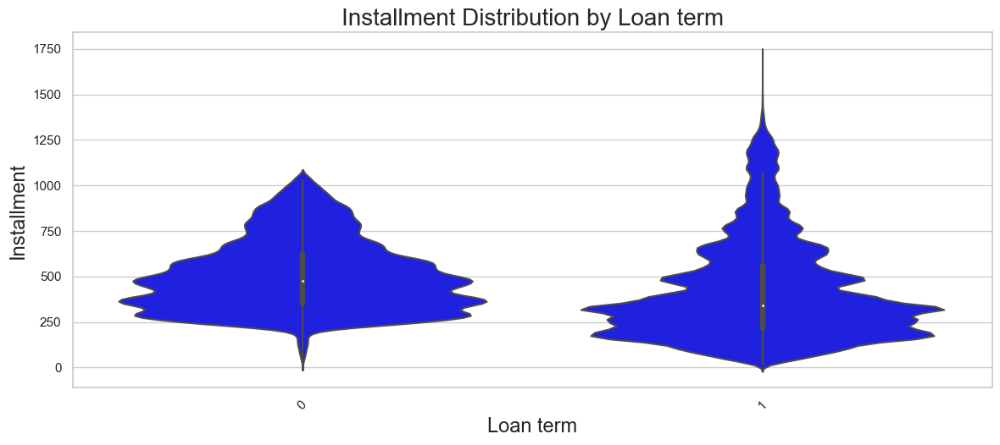

In [23]:
plt.figure(figsize = (14,12))

plt.subplot(211)
g = sns.violinplot(x='term1', y="installment",
                   data=df, color='blue')
g.set_xticklabels(g.get_xticklabels(),rotation=45)
g.set_xlabel("Loan term", fontsize=17)
g.set_ylabel("Installment", fontsize=17)
g.set_title("Installment Distribution by Loan term", fontsize=20)


plt.show()

# 초기 변수 선택

In [24]:
pd.set_option('display.max_columns', None)

In [25]:
df.head(5)

,Unnamed: 0,index,loan_amount,funded_amount,investor_funds,interest_rate,installment,annual_income,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,emp_length1,emp_length2,emp_length3,emp_length4,emp_length5,emp_length6,emp_length7,emp_length8,emp_length9,emp_length10,emp_length11,emp_length12,home_ownership1,home_ownership2,home_ownership3,home_ownership4,home_ownership5,home_ownership6,verification_status1,verification_status2,verification_status3,purpose1,purpose2,purpose3,purpose4,purpose5,purpose6,purpose7,purpose8,purpose9,purpose10,purpose11,purpose12,purpose13,purpose14,addr_state1,addr_state2,addr_state3,addr_state4,addr_state5,addr_state6,addr_state7,addr_state8,addr_state9,addr_state10,addr_state11,addr_state12,addr_state13,addr_state14,addr_state15,addr_state16,addr_state17,addr_state18,addr_state19,addr_state20,addr_state21,addr_state22,addr_state23,addr_state24,addr_state25,addr_state26,addr_state27,addr_state28,addr_state29,addr_state30,addr_state31,addr_state32,addr_state33,addr_state34,addr_state35,addr_state36,addr_state37,addr_state38,addr_state39,addr_state40,addr_state41,addr_state42,addr_state43,addr_state44,addr_state45,addr_state46,addr_state47,addr_state48,addr_state49,addr_state50,addr_state51,initial_list_status1,initial_list_status2,elapsed_t,issue_d1,issue_d2,issue_d3,issue_d4,issue_d5,issue_d6,issue_d7,issue_d8,issue_d9,issue_d10,issue_d11,issue_d12,issue_d13,issue_d14,issue_d15,issue_d16,issue_d17,issue_d18,issue_d19,issue_d20,issue_d21,issue_d22,issue_d23,issue_d24,issue_d25,issue_d26,issue_d27,issue_d28,issue_d29,issue_d30,issue_d31,issue_d32,issue_d33,issue_d34,issue_d35,issue_d36,issue_d37,issue_d38,issue_d39,issue_d40,issue_d41,issue_d42,issue_d43,issue_d44,issue_d45,issue_d46,issue_d47,issue_d48,issue_d49,issue_d50,issue_d51,issue_d52,issue_d53,issue_d54,issue_d55,issue_d56,issue_d57,issue_d58,issue_d59,issue_d60,issue_d61,issue_d62,issue_d63,issue_d64,issue_d65,issue_d66,issue_d67,issue_d68,issue_d69,issue_d70,issue_d71,issue_d72,issue_d73,issue_d74,issue_d75,issue_d76,issue_d77,issue_d78,issue_d79,issue_d80,issue_d81,issue_d82,issue_d83,issue_d84,issue_d85,issue_d86,issue_d87,issue_d88,issue_d89,issue_d90,issue_d91,issue_d92,issue_d93,issue_d94,issue_d95,issue_d96,issue_d97,issue_d98,issue_d99,issue_d100,issue_d101,issue_d102,issue_d103,issue_d104,issue_d105,issue_d106,issue_d107,issue_d108,issue_d109,issue_d110,issue_d111,issue_d112,issue_d113,issue_d114,issue_d115,issue_d116,issue_d117,issue_d118,debt_settlement_flag1,term1,depvar,mths_since_last_delinq1,mths_since_last_delinq2,mths_since_last_delinq3,mths_since_last_delinq4,mths_since_last_delinq5,mths_since_last_delinq6,mths_since_last_delinq7,mths_since_last_delinq8,mths_since_last_delinq9,mths_since_last_delinq10,mths_since_last_delinq11,mths_since_last_major_derog1,mths_since_last_major_derog2,mths_since_last_major_derog3,mths_since_last_major_derog4,mths_since_last_major_derog5,mths_since_last_major_derog6,mths_since_last_major_derog7,mths_since_last_major_derog8,mths_since_last_major_derog9,mths_since_last_major_derog10,mths_since_last_major_derog11,mths_since_last_record1,mths_since_last_record2,mths_since_last_record3,mths_since_last_record4,mths_since_last_record5,mths_since_last_record6,mths_since_last_record7,mths_since_last_record8,mths_since_last_record9,mths_since_last_record10,mths_since_last_record11,mths_since_rcnt_il1,mths_since_rcnt_il2,mths_since_rcnt_il3,mths_since_rcnt_il4,mths_since_rcnt_il5,mths_since_rcnt_il6,mths_since_rcnt_il7,mths_since_rcnt_il8,mths_since_rcnt_il9,mths_since_rcnt_il10,mths_since_rcnt_il11,mths_since_recent_bc

In [26]:
df_col = df.columns

In [27]:
df_col[df_col.str.contains('emp_length')]

Index(['emp_length1', 'emp_length2', 'emp_length3', 'emp_length4',
       'emp_length5', 'emp_length6', 'emp_length7', 'emp_length8',
       'emp_length9', 'emp_length10', 'emp_length11', 'emp_length12'],
      dtype='object')

In [28]:
df_col[df_col.str.contains('home_ownership')]

Index(['home_ownership1', 'home_ownership2', 'home_ownership3',
       'home_ownership4', 'home_ownership5', 'home_ownership6'],
      dtype='object')

In [29]:
df_col[df_col.str.contains('verification_status')]

Index(['verification_status1', 'verification_status2', 'verification_status3'], dtype='object')

In [30]:
df_col[df_col.str.contains('purpose')]

Index(['purpose1', 'purpose2', 'purpose3', 'purpose4', 'purpose5', 'purpose6',
       'purpose7', 'purpose8', 'purpose9', 'purpose10', 'purpose11',
       'purpose12', 'purpose13', 'purpose14'],
      dtype='object')

In [31]:
df_col[df_col.str.contains('addr_state')]

Index(['addr_state1', 'addr_state2', 'addr_state3', 'addr_state4',
       'addr_state5', 'addr_state6', 'addr_state7', 'addr_state8',
       'addr_state9', 'addr_state10', 'addr_state11', 'addr_state12',
       'addr_state13', 'addr_state14', 'addr_state15', 'addr_state16',
       'addr_state17', 'addr_state18', 'addr_state19', 'addr_state20',
       'addr_state21', 'addr_state22', 'addr_state23', 'addr_state24',
       'addr_state25', 'addr_state26', 'addr_state27', 'addr_state28',
       'addr_state29', 'addr_state30', 'addr_state31', 'addr_state32',
       'addr_state33', 'addr_state34', 'addr_state35', 'addr_state36',
       'addr_state37', 'addr_state38', 'addr_state39', 'addr_state40',
       'addr_state41', 'addr_state42', 'addr_state43', 'addr_state44',
       'addr_state45', 'addr_state46', 'addr_state47', 'addr_state48',
       'addr_state49', 'addr_state50', 'addr_state51'],
      dtype='object')

In [32]:
df_col[df_col.str.contains('debt_settlement_flag1')]

Index(['debt_settlement_flag1'], dtype='object')

In [33]:
df_col[df_col.str.contains('term1')]

Index(['term1'], dtype='object')

In [34]:
df_col[df_col.str.contains('mths_since_last_delinq')]

Index(['mths_since_last_delinq1', 'mths_since_last_delinq2',
       'mths_since_last_delinq3', 'mths_since_last_delinq4',
       'mths_since_last_delinq5', 'mths_since_last_delinq6',
       'mths_since_last_delinq7', 'mths_since_last_delinq8',
       'mths_since_last_delinq9', 'mths_since_last_delinq10',
       'mths_since_last_delinq11'],
      dtype='object')

In [35]:
df_col[df_col.str.contains('mths_since_last_major_derog')]

Index(['mths_since_last_major_derog1', 'mths_since_last_major_derog2',
       'mths_since_last_major_derog3', 'mths_since_last_major_derog4',
       'mths_since_last_major_derog5', 'mths_since_last_major_derog6',
       'mths_since_last_major_derog7', 'mths_since_last_major_derog8',
       'mths_since_last_major_derog9', 'mths_since_last_major_derog10',
       'mths_since_last_major_derog11'],
      dtype='object')

In [36]:
df_col[df_col.str.contains('mths_since_last_record')]

Index(['mths_since_last_record1', 'mths_since_last_record2',
       'mths_since_last_record3', 'mths_since_last_record4',
       'mths_since_last_record5', 'mths_since_last_record6',
       'mths_since_last_record7', 'mths_since_last_record8',
       'mths_since_last_record9', 'mths_since_last_record10',
       'mths_since_last_record11'],
      dtype='object')

In [37]:
df_col[df_col.str.contains('mths_since_rcnt_il')]

Index(['mths_since_rcnt_il1', 'mths_since_rcnt_il2', 'mths_since_rcnt_il3',
       'mths_since_rcnt_il4', 'mths_since_rcnt_il5', 'mths_since_rcnt_il6',
       'mths_since_rcnt_il7', 'mths_since_rcnt_il8', 'mths_since_rcnt_il9',
       'mths_since_rcnt_il10', 'mths_since_rcnt_il11'],
      dtype='object')

In [38]:
df_col[df_col.str.contains('mths_since_recent_bc')]

Index(['mths_since_recent_bc1', 'mths_since_recent_bc2',
       'mths_since_recent_bc3', 'mths_since_recent_bc4',
       'mths_since_recent_bc5', 'mths_since_recent_bc6',
       'mths_since_recent_bc7', 'mths_since_recent_bc8',
       'mths_since_recent_bc9', 'mths_since_recent_bc10',
       'mths_since_recent_bc11', 'mths_since_recent_bc_dlq1',
       'mths_since_recent_bc_dlq2', 'mths_since_recent_bc_dlq3',
       'mths_since_recent_bc_dlq4', 'mths_since_recent_bc_dlq5',
       'mths_since_recent_bc_dlq6', 'mths_since_recent_bc_dlq7',
       'mths_since_recent_bc_dlq8', 'mths_since_recent_bc_dlq9',
       'mths_since_recent_bc_dlq10', 'mths_since_recent_bc_dlq11'],
      dtype='object')

In [39]:
df_col[df_col.str.contains('mths_since_recent_bc_dlq')]

Index(['mths_since_recent_bc_dlq1', 'mths_since_recent_bc_dlq2',
       'mths_since_recent_bc_dlq3', 'mths_since_recent_bc_dlq4',
       'mths_since_recent_bc_dlq5', 'mths_since_recent_bc_dlq6',
       'mths_since_recent_bc_dlq7', 'mths_since_recent_bc_dlq8',
       'mths_since_recent_bc_dlq9', 'mths_since_recent_bc_dlq10',
       'mths_since_recent_bc_dlq11'],
      dtype='object')

In [40]:
df_col[df_col.str.contains('mths_since_recent_inq')]

Index(['mths_since_recent_inq1', 'mths_since_recent_inq2',
       'mths_since_recent_inq3', 'mths_since_recent_inq4',
       'mths_since_recent_inq5', 'mths_since_recent_inq6',
       'mths_since_recent_inq7', 'mths_since_recent_inq8',
       'mths_since_recent_inq9', 'mths_since_recent_inq10'],
      dtype='object')

In [41]:
df_col[df_col.str.contains('mths_since_recent_revol_delinq')]

Index(['mths_since_recent_revol_delinq1', 'mths_since_recent_revol_delinq2',
       'mths_since_recent_revol_delinq3', 'mths_since_recent_revol_delinq4',
       'mths_since_recent_revol_delinq5', 'mths_since_recent_revol_delinq6',
       'mths_since_recent_revol_delinq7', 'mths_since_recent_revol_delinq8',
       'mths_since_recent_revol_delinq9', 'mths_since_recent_revol_delinq10',
       'mths_since_recent_revol_delinq11'],
      dtype='object')

In [42]:
df_x = df[['loan_amount','funded_amount','interest_rate','total_pymnt','total_rec_prncp','investor_funds','installment','annual_income','dti','delinq_2yrs','fico_range_low','fico_range_high','inq_last_6mths','open_acc', 'pub_rec','revol_bal','revol_util','total_acc','last_fico_range_high','last_fico_range_low','collections_12_mths_ex_med', 'acc_now_delinq','tot_coll_amt','tot_cur_bal','chargeoff_within_12_mths', 'delinq_amnt','pub_rec_bankruptcies', 'tax_liens','emp_length1', 'emp_length2', 'emp_length3', 'emp_length4',
       'emp_length5', 'emp_length6', 'emp_length7', 'emp_length8',
       'emp_length9', 'emp_length10', 'emp_length11', 'emp_length12','home_ownership1', 'home_ownership2', 'home_ownership3',
       'home_ownership4', 'home_ownership5', 'home_ownership6','verification_status1', 'verification_status2', 'verification_status3',
            'purpose1', 'purpose2', 'purpose3', 'purpose4', 'purpose5', 'purpose6',
       'purpose7', 'purpose8', 'purpose9', 'purpose10', 'purpose11',
       'purpose12', 'purpose13', 'purpose14','addr_state1', 'addr_state2', 'addr_state3', 'addr_state4',
       'addr_state5', 'addr_state6', 'addr_state7', 'addr_state8',
       'addr_state9', 'addr_state10', 'addr_state11', 'addr_state12',
       'addr_state13', 'addr_state14', 'addr_state15', 'addr_state16',
       'addr_state17', 'addr_state18', 'addr_state19', 'addr_state20',
       'addr_state21', 'addr_state22', 'addr_state23', 'addr_state24',
       'addr_state25', 'addr_state26', 'addr_state27', 'addr_state28',
       'addr_state29', 'addr_state30', 'addr_state31', 'addr_state32',
       'addr_state33', 'addr_state34', 'addr_state35', 'addr_state36',
       'addr_state37', 'addr_state38', 'addr_state39', 'addr_state40',
       'addr_state41', 'addr_state42', 'addr_state43', 'addr_state44',
       'addr_state45', 'addr_state46', 'addr_state47', 'addr_state48',
       'addr_state49', 'addr_state50', 'addr_state51', 'term1', 'mths_since_last_delinq1', 'mths_since_last_delinq2',
       'mths_since_last_delinq3', 'mths_since_last_delinq4',
       'mths_since_last_delinq5', 'mths_since_last_delinq6',
       'mths_since_last_delinq7', 'mths_since_last_delinq8',
       'mths_since_last_delinq9', 'mths_since_last_delinq10',
       'mths_since_last_delinq11','mths_since_last_major_derog1', 'mths_since_last_major_derog2',
       'mths_since_last_major_derog3', 'mths_since_last_major_derog4',
       'mths_since_last_major_derog5', 'mths_since_last_major_derog6',
       'mths_since_last_major_derog7', 'mths_since_last_major_derog8',
       'mths_since_last_major_derog9', 'mths_since_last_major_derog10',
       'mths_since_last_major_derog11','mths_since_last_record1', 'mths_since_last_record2',
       'mths_since_last_record3', 'mths_since_last_record4',
       'mths_since_last_record5', 'mths_since_last_record6',
       'mths_since_last_record7', 'mths_since_last_record8',
       'mths_since_last_record9', 'mths_since_last_record10',
       'mths_since_last_record11','mths_since_rcnt_il1', 'mths_since_rcnt_il2', 'mths_since_rcnt_il3',
       'mths_since_rcnt_il4', 'mths_since_rcnt_il5', 'mths_since_rcnt_il6',
       'mths_since_rcnt_il7', 'mths_since_rcnt_il8', 'mths_since_rcnt_il9',
       'mths_since_rcnt_il10', 'mths_since_rcnt_il11', 'mths_since_recent_bc1', 'mths_since_recent_bc2',
       'mths_since_recent_bc3', 'mths_since_recent_bc4',
       'mths_since_recent_bc5', 'mths_since_recent_bc6',
       'mths_since_recent_bc7', 'mths_since_recent_bc8',
       'mths_since_recent_bc9', 'mths_since_recent_bc10',
       'mths_since_recent_bc11', 'mths_since_recent_bc_dlq1',
       'mths_since_recent_bc_dlq2', 'mths_since_recent_bc_dlq3',
       'mths_since_recent_bc_dlq4', 'mths_since_recent_bc_dlq5',
       'mths_since_recent_bc_dlq6', 'mths_since_recent_bc_dlq7',
       'mths_since_recent_bc_dlq8', 'mths_since_recent_bc_dlq9',
       'mths_since_recent_bc_dlq10', 'mths_since_recent_bc_dlq11','mths_since_recent_inq1', 'mths_since_recent_inq2',
       'mths_since_recent_inq3', 'mths_since_recent_inq4',
       'mths_since_recent_inq5', 'mths_since_recent_inq6',
       'mths_since_recent_inq7', 'mths_since_recent_inq8',
       'mths_since_recent_inq9', 'mths_since_recent_inq10', 'mths_since_recent_revol_delinq1', 'mths_since_recent_revol_delinq2',
       'mths_since_recent_revol_delinq3', 'mths_since_recent_revol_delinq4',
       'mths_since_recent_revol_delinq5', 'mths_since_recent_revol_delinq6',
       'mths_since_recent_revol_delinq7', 'mths_since_recent_revol_delinq8',
       'mths_since_recent_revol_delinq9', 'mths_since_recent_revol_delinq10',
       'mths_since_recent_revol_delinq11']]
df_x

,loan_amount,funded_amount,interest_rate,total_pymnt,total_rec_prncp,investor_funds,installment,annual_income,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,emp_length1,emp_length2,emp_length3,emp_length4,emp_length5,emp_length6,emp_length7,emp_length8,emp_length9,emp_length10,emp_length11,emp_length12,home_ownership1,home_ownership2,home_ownership3,home_ownership4,home_ownership5,home_ownership6,verification_status1,verification_status2,verification_status3,purpose1,purpose2,purpose3,purpose4,purpose5,purpose6,purpose7,purpose8,purpose9,purpose10,purpose11,purpose12,purpose13,purpose14,addr_state1,addr_state2,addr_state3,addr_state4,addr_state5,addr_state6,addr_state7,addr_state8,addr_state9,addr_state10,addr_state11,addr_state12,addr_state13,addr_state14,addr_state15,addr_state16,addr_state17,addr_state18,addr_state19,addr_state20,addr_state21,addr_state22,addr_state23,addr_state24,addr_state25,addr_state26,addr_state27,addr_state28,addr_state29,addr_state30,addr_state31,addr_state32,addr_state33,addr_state34,addr_state35,addr_state36,addr_state37,addr_state38,addr_state39,addr_state40,addr_state41,addr_state42,addr_state43,addr_state44,addr_state45,addr_state46,addr_state47,addr_state48,addr_state49,addr_state50,addr_state51,term1,mths_since_last_delinq1,mths_since_last_delinq2,mths_since_last_delinq3,mths_since_last_delinq4,mths_since_last_delinq5,mths_since_last_delinq6,mths_since_last_delinq7,mths_since_last_delinq8,mths_since_last_delinq9,mths_since_last_delinq10,mths_since_last_delinq11,mths_since_last_major_derog1,mths_since_last_major_derog2,mths_since_last_major_derog3,mths_since_last_major_derog4,mths_since_last_major_derog5,mths_since_last_major_derog6,mths_since_last_major_derog7,mths_since_last_major_derog8,mths_since_last_major_derog9,mths_since_last_major_derog10,mths_since_last_major_derog11,mths_since_last_record1,mths_since_last_record2,mths_since_last_record3,mths_since_last_record4,mths_since_last_record5,mths_since_last_record6,mths_since_last_record7,mths_since_last_record8,mths_since_last_record9,mths_since_last_record10,mths_since_last_record11,mths_since_rcnt_il1,mths_since_rcnt_il2,mths_since_rcnt_il3,mths_since_rcnt_il4,mths_since_rcnt_il5,mths_since_rcnt_il6,mths_since_rcnt_il7,mths_since_rcnt_il8,mths_since_rcnt_il9,mths_since_rcnt_il10,mths_since_rcnt_il11,mths_since_recent_bc1,mths_since_recent_bc2,mths_since_recent_bc3,mths_since_recent_bc4,mths_since_recent_bc5,mths_since_recent_bc6,mths_since_recent_bc7,mths_since_recent_bc8,mths_since_recent_bc9,mths_since_recent_bc10,mths_since_recent_bc11,mths_since_recent_bc_dlq1,mths_since_recent_bc_dlq2,mths_since_recent_bc_dlq3,mths_since_recent_bc_dlq4,mths_since_recent_bc_dlq5,mths_since_recent_bc_dlq6,mths_since_recent_bc_dlq7,mths_since_recent_bc_dlq8,mths_since_recent_bc_dlq9,mths_since_recent_bc_dlq10,mths_since_recent_bc_dlq11,mths_since_recent_inq1,mths_since_recent_inq2,mths_since_recent_inq3,mths_since_recent_inq4,mths_since_recent_inq5,mths_since_recent_inq6,mths_since_recent_inq7,mths_since_recent_inq8,mths_since_recent_inq9,mths_since_recent_inq10,mths_since_recent_revol_delinq1,mths_since_recent_revol_delinq2,mths_since_recent_revol_delinq3,mths_since_recent_revol_delinq4,mths_since_recent_revol_delinq5,mths_since_recent_revol_delinq6,mths_since_recent_revol_delinq7,mths_since_recent_revol_delinq8,mths_since_recent_revol_delinq9,mths_since_recent_revol_delinq10,mths_since_recent_revol_delinq11
0,12000,12000,0.08,9735.81,5646.56,12000.00,375.43,90641.00,10.20,0,690,694,1,5,0,5673,0.41,20,584,580,0,0,0,27898.00,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0

In [43]:
df_y = df[['depvar']]

In [44]:
df_x_y = pd.concat([df_x,df_y],axis=1)
df_x_y

,loan_amount,funded_amount,interest_rate,total_pymnt,total_rec_prncp,investor_funds,installment,annual_income,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,emp_length1,emp_length2,emp_length3,emp_length4,emp_length5,emp_length6,emp_length7,emp_length8,emp_length9,emp_length10,emp_length11,emp_length12,home_ownership1,home_ownership2,home_ownership3,home_ownership4,home_ownership5,home_ownership6,verification_status1,verification_status2,verification_status3,purpose1,purpose2,purpose3,purpose4,purpose5,purpose6,purpose7,purpose8,purpose9,purpose10,purpose11,purpose12,purpose13,purpose14,addr_state1,addr_state2,addr_state3,addr_state4,addr_state5,addr_state6,addr_state7,addr_state8,addr_state9,addr_state10,addr_state11,addr_state12,addr_state13,addr_state14,addr_state15,addr_state16,addr_state17,addr_state18,addr_state19,addr_state20,addr_state21,addr_state22,addr_state23,addr_state24,addr_state25,addr_state26,addr_state27,addr_state28,addr_state29,addr_state30,addr_state31,addr_state32,addr_state33,addr_state34,addr_state35,addr_state36,addr_state37,addr_state38,addr_state39,addr_state40,addr_state41,addr_state42,addr_state43,addr_state44,addr_state45,addr_state46,addr_state47,addr_state48,addr_state49,addr_state50,addr_state51,term1,mths_since_last_delinq1,mths_since_last_delinq2,mths_since_last_delinq3,mths_since_last_delinq4,mths_since_last_delinq5,mths_since_last_delinq6,mths_since_last_delinq7,mths_since_last_delinq8,mths_since_last_delinq9,mths_since_last_delinq10,mths_since_last_delinq11,mths_since_last_major_derog1,mths_since_last_major_derog2,mths_since_last_major_derog3,mths_since_last_major_derog4,mths_since_last_major_derog5,mths_since_last_major_derog6,mths_since_last_major_derog7,mths_since_last_major_derog8,mths_since_last_major_derog9,mths_since_last_major_derog10,mths_since_last_major_derog11,mths_since_last_record1,mths_since_last_record2,mths_since_last_record3,mths_since_last_record4,mths_since_last_record5,mths_since_last_record6,mths_since_last_record7,mths_since_last_record8,mths_since_last_record9,mths_since_last_record10,mths_since_last_record11,mths_since_rcnt_il1,mths_since_rcnt_il2,mths_since_rcnt_il3,mths_since_rcnt_il4,mths_since_rcnt_il5,mths_since_rcnt_il6,mths_since_rcnt_il7,mths_since_rcnt_il8,mths_since_rcnt_il9,mths_since_rcnt_il10,mths_since_rcnt_il11,mths_since_recent_bc1,mths_since_recent_bc2,mths_since_recent_bc3,mths_since_recent_bc4,mths_since_recent_bc5,mths_since_recent_bc6,mths_since_recent_bc7,mths_since_recent_bc8,mths_since_recent_bc9,mths_since_recent_bc10,mths_since_recent_bc11,mths_since_recent_bc_dlq1,mths_since_recent_bc_dlq2,mths_since_recent_bc_dlq3,mths_since_recent_bc_dlq4,mths_since_recent_bc_dlq5,mths_since_recent_bc_dlq6,mths_since_recent_bc_dlq7,mths_since_recent_bc_dlq8,mths_since_recent_bc_dlq9,mths_since_recent_bc_dlq10,mths_since_recent_bc_dlq11,mths_since_recent_inq1,mths_since_recent_inq2,mths_since_recent_inq3,mths_since_recent_inq4,mths_since_recent_inq5,mths_since_recent_inq6,mths_since_recent_inq7,mths_since_recent_inq8,mths_since_recent_inq9,mths_since_recent_inq10,mths_since_recent_revol_delinq1,mths_since_recent_revol_delinq2,mths_since_recent_revol_delinq3,mths_since_recent_revol_delinq4,mths_since_recent_revol_delinq5,mths_since_recent_revol_delinq6,mths_since_recent_revol_delinq7,mths_since_recent_revol_delinq8,mths_since_recent_revol_delinq9,mths_since_recent_revol_delinq10,mths_since_recent_revol_delinq11,depvar
0,12000,12000,0.08,9735.81,5646.56,12000.00,375.43,90641.00,10.20,0,690,694,1,5,0,5673,0.41,20,584,580,0,0,0,27898.00,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,

# 더미변수 처리

In [45]:
df_x_y.drop(['purpose1','addr_state1','verification_status1','home_ownership1'], axis=1, inplace = True)

In [46]:
df_x_y.head(5)

,loan_amount,funded_amount,interest_rate,total_pymnt,total_rec_prncp,investor_funds,installment,annual_income,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,emp_length1,emp_length2,emp_length3,emp_length4,emp_length5,emp_length6,emp_length7,emp_length8,emp_length9,emp_length10,emp_length11,emp_length12,home_ownership2,home_ownership3,home_ownership4,home_ownership5,home_ownership6,verification_status2,verification_status3,purpose2,purpose3,purpose4,purpose5,purpose6,purpose7,purpose8,purpose9,purpose10,purpose11,purpose12,purpose13,purpose14,addr_state2,addr_state3,addr_state4,addr_state5,addr_state6,addr_state7,addr_state8,addr_state9,addr_state10,addr_state11,addr_state12,addr_state13,addr_state14,addr_state15,addr_state16,addr_state17,addr_state18,addr_state19,addr_state20,addr_state21,addr_state22,addr_state23,addr_state24,addr_state25,addr_state26,addr_state27,addr_state28,addr_state29,addr_state30,addr_state31,addr_state32,addr_state33,addr_state34,addr_state35,addr_state36,addr_state37,addr_state38,addr_state39,addr_state40,addr_state41,addr_state42,addr_state43,addr_state44,addr_state45,addr_state46,addr_state47,addr_state48,addr_state49,addr_state50,addr_state51,term1,mths_since_last_delinq1,mths_since_last_delinq2,mths_since_last_delinq3,mths_since_last_delinq4,mths_since_last_delinq5,mths_since_last_delinq6,mths_since_last_delinq7,mths_since_last_delinq8,mths_since_last_delinq9,mths_since_last_delinq10,mths_since_last_delinq11,mths_since_last_major_derog1,mths_since_last_major_derog2,mths_since_last_major_derog3,mths_since_last_major_derog4,mths_since_last_major_derog5,mths_since_last_major_derog6,mths_since_last_major_derog7,mths_since_last_major_derog8,mths_since_last_major_derog9,mths_since_last_major_derog10,mths_since_last_major_derog11,mths_since_last_record1,mths_since_last_record2,mths_since_last_record3,mths_since_last_record4,mths_since_last_record5,mths_since_last_record6,mths_since_last_record7,mths_since_last_record8,mths_since_last_record9,mths_since_last_record10,mths_since_last_record11,mths_since_rcnt_il1,mths_since_rcnt_il2,mths_since_rcnt_il3,mths_since_rcnt_il4,mths_since_rcnt_il5,mths_since_rcnt_il6,mths_since_rcnt_il7,mths_since_rcnt_il8,mths_since_rcnt_il9,mths_since_rcnt_il10,mths_since_rcnt_il11,mths_since_recent_bc1,mths_since_recent_bc2,mths_since_recent_bc3,mths_since_recent_bc4,mths_since_recent_bc5,mths_since_recent_bc6,mths_since_recent_bc7,mths_since_recent_bc8,mths_since_recent_bc9,mths_since_recent_bc10,mths_since_recent_bc11,mths_since_recent_bc_dlq1,mths_since_recent_bc_dlq2,mths_since_recent_bc_dlq3,mths_since_recent_bc_dlq4,mths_since_recent_bc_dlq5,mths_since_recent_bc_dlq6,mths_since_recent_bc_dlq7,mths_since_recent_bc_dlq8,mths_since_recent_bc_dlq9,mths_since_recent_bc_dlq10,mths_since_recent_bc_dlq11,mths_since_recent_inq1,mths_since_recent_inq2,mths_since_recent_inq3,mths_since_recent_inq4,mths_since_recent_inq5,mths_since_recent_inq6,mths_since_recent_inq7,mths_since_recent_inq8,mths_since_recent_inq9,mths_since_recent_inq10,mths_since_recent_revol_delinq1,mths_since_recent_revol_delinq2,mths_since_recent_revol_delinq3,mths_since_recent_revol_delinq4,mths_since_recent_revol_delinq5,mths_since_recent_revol_delinq6,mths_since_recent_revol_delinq7,mths_since_recent_revol_delinq8,mths_since_recent_revol_delinq9,mths_since_recent_revol_delinq10,mths_since_recent_revol_delinq11,depvar
0,12000,12000,0.08,9735.81,5646.56,12000.00,375.43,90641.00,10.20,0,690,694,1,5,0,5673,0.41,20,584,580,0,0,0,27898.00,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,

In [47]:
def undummify(df, prefix_sep="_"):
    cols2collapse = {
        item.split(prefix_sep)[0]: (prefix_sep in item) for item in df.columns
    }
    series_list = []
    for col, needs_to_collapse in cols2collapse.items():
        if needs_to_collapse:
            undummified = (
                df.filter(like=col)
                .idxmax(axis=1)
                .apply(lambda x: x.split(prefix_sep, maxsplit=1)[1])
                .rename(col)
            )
            series_list.append(undummified)
        else:
            series_list.append(df[col])
    undummified_df = pd.concat(series_list, axis=1)
    return undummified_df

In [48]:
#emp_length
rename='emplength'
name='emp_length'
dic={};L=[]
for i in range(1,13):
    st = name + str(i)
    re = rename + '_' +str(i)
    L.append(st)
    dic[st]=re
emp_length=df_x_y[L]
emp_length=emp_length.rename(columns=dic)

In [49]:
emp_length

,emplength_1,emplength_2,emplength_3,emplength_4,emplength_5,emplength_6,emplength_7,emplength_8,emplength_9,emplength_10,emplength_11,emplength_12
0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
874330,0,0,0,0,0,0,1,0,0,0,0,0
874331,0,0,0,0,0,0,0,0,0,0,0,1
874332,0,0,0,0,0,0,0,0,0,0,1,0
874333,0,1,0,0,0,0,0,0,0,0,0,0


In [50]:
emp_length_df = undummify(emp_length)
emp_length_df

,emplength
0,2
1,2
2,6
3,5
4,4
...,...
874330,7
874331,12
874332,11
874333,2


In [51]:
emp_length_df.rename(columns={'emplength': 'emp_length'},inplace = True)
emp_length_df

,emp_length
0,2
1,2
2,6
3,5
4,4
...,...
874330,7
874331,12
874332,11
874333,2


In [52]:
#mths_since_last_delinq
rename='mthssincelastdelinq'
name='mths_since_last_delinq'
dic={};L=[]
for i in range(1,12):
    st = name + str(i)
    re = rename + '_' +str(i)
    L.append(st)
    dic[st]=re
mths_since_last_delinq=df_x_y[L]
mths_since_last_delinq=mths_since_last_delinq.rename(columns=dic)

In [53]:
mths_since_last_delinq

,mthssincelastdelinq_1,mthssincelastdelinq_2,mthssincelastdelinq_3,mthssincelastdelinq_4,mthssincelastdelinq_5,mthssincelastdelinq_6,mthssincelastdelinq_7,mthssincelastdelinq_8,mthssincelastdelinq_9,mthssincelastdelinq_10,mthssincelastdelinq_11
0,0,0,0,0,0,1,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,0
2,0,0,1,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...
874330,1,0,0,0,0,0,0,0,0,0,0
874331,1,0,0,0,0,0,0,0,0,0,0
874332,1,0,0,0,0,0,0,0,0,0,0
874333,0,0,0,0,0,1,0,0,0,0,0


In [54]:
mths_since_last_delinq_df = undummify(mths_since_last_delinq)
mths_since_last_delinq_df

,mthssincelastdelinq
0,6
1,5
2,3
3,1
4,10
...,...
874330,1
874331,1
874332,1
874333,6


In [55]:
mths_since_last_delinq_df.rename(columns={'mthssincelastdelinq': 'mths_since_last_delinq'},inplace = True)
mths_since_last_delinq_df

,mths_since_last_delinq
0,6
1,5
2,3
3,1
4,10
...,...
874330,1
874331,1
874332,1
874333,6


In [56]:
# mths_since_last_major_derog
rename='mthssincelastmajorderog'
name='mths_since_last_major_derog'
dic={};L=[]
for i in range(1,12):
    st = name + str(i)
    re = rename + '_' +str(i)
    L.append(st)
    dic[st]=re
mths_since_last_major_derog=df_x_y[L]
mths_since_last_major_derog=mths_since_last_major_derog.rename(columns=dic)

In [57]:
mths_since_last_major_derog

,mthssincelastmajorderog_1,mthssincelastmajorderog_2,mthssincelastmajorderog_3,mthssincelastmajorderog_4,mthssincelastmajorderog_5,mthssincelastmajorderog_6,mthssincelastmajorderog_7,mthssincelastmajorderog_8,mthssincelastmajorderog_9,mthssincelastmajorderog_10,mthssincelastmajorderog_11
0,0,0,0,1,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
874330,1,0,0,0,0,0,0,0,0,0,0
874331,1,0,0,0,0,0,0,0,0,0,0
874332,1,0,0,0,0,0,0,0,0,0,0
874333,0,0,1,0,0,0,0,0,0,0,0


In [58]:
mths_since_last_major_derog_df = undummify(mths_since_last_major_derog)
mths_since_last_major_derog_df

,mthssincelastmajorderog
0,4
1,1
2,2
3,1
4,1
...,...
874330,1
874331,1
874332,1
874333,3


In [59]:
mths_since_last_major_derog_df.rename(columns={'mthssincelastmajorderog': 'mths_since_last_major_derog'},inplace = True)
mths_since_last_major_derog_df

,mths_since_last_major_derog
0,4
1,1
2,2
3,1
4,1
...,...
874330,1
874331,1
874332,1
874333,3


In [60]:
# mths_since_last_record
rename='mthssincelastrecord'
name='mths_since_last_record'
dic={};L=[]
for i in range(1,12):
    st = name + str(i)
    re = rename + '_' +str(i)
    L.append(st)
    dic[st]=re
mths_since_last_record=df_x_y[L]
mths_since_last_record=mths_since_last_record.rename(columns=dic)

In [61]:
mths_since_last_record

,mthssincelastrecord_1,mthssincelastrecord_2,mthssincelastrecord_3,mthssincelastrecord_4,mthssincelastrecord_5,mthssincelastrecord_6,mthssincelastrecord_7,mthssincelastrecord_8,mthssincelastrecord_9,mthssincelastrecord_10,mthssincelastrecord_11
0,1,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
874330,1,0,0,0,0,0,0,0,0,0,0
874331,1,0,0,0,0,0,0,0,0,0,0
874332,1,0,0,0,0,0,0,0,0,0,0
874333,0,0,0,0,0,0,1,0,0,0,0


In [62]:
mths_since_last_record_df = undummify(mths_since_last_record)
mths_since_last_record_df

,mthssincelastrecord
0,1
1,1
2,1
3,1
4,1
...,...
874330,1
874331,1
874332,1
874333,7


In [63]:
mths_since_last_record_df['mthssincelastrecord'].value_counts()
#1이 굉장히 많음ㅋ

1     722047
5      16397
7      15741
10     15654
6      15543
2      15506
3      15425
4      15196
9      14526
8      14435
11     13865
Name: mthssincelastrecord, dtype: int64

In [64]:
mths_since_last_record_df.rename(columns={'mthssincelastrecord': 'mths_since_last_record'},inplace = True)
mths_since_last_record_df

,mths_since_last_record
0,1
1,1
2,1
3,1
4,1
...,...
874330,1
874331,1
874332,1
874333,7


In [65]:
# mths_since_rcnt_il
rename='mthssincercntil'
name='mths_since_rcnt_il'
dic={};L=[]
for i in range(1,12):
    st = name + str(i)
    re = rename + '_' +str(i)
    L.append(st)
    dic[st]=re
mths_since_rcnt_il=df_x_y[L]
mths_since_rcnt_il=mths_since_rcnt_il.rename(columns=dic)

In [66]:
mths_since_rcnt_il

,mthssincercntil_1,mthssincercntil_2,mthssincercntil_3,mthssincercntil_4,mthssincercntil_5,mthssincercntil_6,mthssincercntil_7,mthssincercntil_8,mthssincercntil_9,mthssincercntil_10,mthssincercntil_11
0,1,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,1,0,0,0,0,0
2,0,0,0,0,0,0,0,0,1,0,0
3,0,0,1,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
874330,1,0,0,0,0,0,0,0,0,0,0
874331,1,0,0,0,0,0,0,0,0,0,0
874332,1,0,0,0,0,0,0,0,0,0,0
874333,0,0,0,0,1,0,0,0,0,0,0


In [67]:
mths_since_rcnt_il_df = undummify(mths_since_rcnt_il)
mths_since_rcnt_il_df

,mthssincercntil
0,1
1,6
2,9
3,3
4,1
...,...
874330,1
874331,1
874332,1
874333,5


In [68]:
mths_since_rcnt_il_df.rename(columns={'mthssincercntil': 'mths_since_rcnt_il'},inplace = True)
mths_since_rcnt_il_df

,mths_since_rcnt_il
0,1
1,6
2,9
3,3
4,1
...,...
874330,1
874331,1
874332,1
874333,5


In [69]:
# mths_since_recent_bc
rename='mthssincerecentbc'
name='mths_since_recent_bc'
dic={};L=[]
for i in range(1,12):
    st = name + str(i)
    re = rename + '_' +str(i)
    L.append(st)
    dic[st]=re
mths_since_recent_bc=df_x_y[L]
mths_since_recent_bc=mths_since_recent_bc.rename(columns=dic)

In [70]:
mths_since_recent_bc

,mthssincerecentbc_1,mthssincerecentbc_2,mthssincerecentbc_3,mthssincerecentbc_4,mthssincerecentbc_5,mthssincerecentbc_6,mthssincerecentbc_7,mthssincerecentbc_8,mthssincerecentbc_9,mthssincerecentbc_10,mthssincerecentbc_11
0,0,0,0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,0,0,0,1,0,0
2,0,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
874330,0,0,0,0,0,1,0,0,0,0,0
874331,0,0,0,0,0,0,0,0,0,1,0
874332,0,0,0,0,1,0,0,0,0,0,0
874333,0,0,0,0,0,1,0,0,0,0,0


In [71]:
mths_since_recent_bc_df = undummify(mths_since_recent_bc)
mths_since_recent_bc_df

,mthssincerecentbc
0,10
1,9
2,2
3,6
4,6
...,...
874330,6
874331,10
874332,5
874333,6


In [72]:
mths_since_recent_bc_df.rename(columns={'mthssincerecentbc': 'mths_since_recent_bc'},inplace = True)
mths_since_recent_bc_df

,mths_since_recent_bc
0,10
1,9
2,2
3,6
4,6
...,...
874330,6
874331,10
874332,5
874333,6


In [73]:
# mths_since_recent_bc_dlq
rename='mthssincerecentbcdlq'
name='mths_since_recent_bc_dlq'
dic={};L=[]
for i in range(1,12):
    st = name + str(i)
    re = rename + '_' +str(i)
    L.append(st)
    dic[st]=re
mths_since_recent_bc_dlq=df_x_y[L]
mths_since_recent_bc_dlq=mths_since_recent_bc_dlq.rename(columns=dic)

In [74]:
mths_since_recent_bc_dlq

,mthssincerecentbcdlq_1,mthssincerecentbcdlq_2,mthssincerecentbcdlq_3,mthssincerecentbcdlq_4,mthssincerecentbcdlq_5,mthssincerecentbcdlq_6,mthssincerecentbcdlq_7,mthssincerecentbcdlq_8,mthssincerecentbcdlq_9,mthssincerecentbcdlq_10,mthssincerecentbcdlq_11
0,1,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,1,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
874330,1,0,0,0,0,0,0,0,0,0,0
874331,1,0,0,0,0,0,0,0,0,0,0
874332,1,0,0,0,0,0,0,0,0,0,0
874333,0,0,0,1,0,0,0,0,0,0,0


In [75]:
mths_since_recent_bc_dlq_df = undummify(mths_since_recent_bc_dlq)
mths_since_recent_bc_dlq_df

,mthssincerecentbcdlq
0,1
1,7
2,1
3,1
4,1
...,...
874330,1
874331,1
874332,1
874333,4


In [76]:
mths_since_recent_bc_dlq_df.rename(columns={'mthssincerecentbcdlq': 'mths_since_recent_bc_dlq'},inplace = True)
mths_since_recent_bc_dlq_df

,mths_since_recent_bc_dlq
0,1
1,7
2,1
3,1
4,1
...,...
874330,1
874331,1
874332,1
874333,4


In [77]:
# mths_since_recent_inq
rename='mthssincerecentinq'
name='mths_since_recent_inq'
dic={};L=[]
for i in range(1,11):
    st = name + str(i)
    re = rename + '_' +str(i)
    L.append(st)
    dic[st]=re
mths_since_recent_inq=df_x_y[L]
mths_since_recent_inq=mths_since_recent_inq.rename(columns=dic)

In [78]:
mths_since_recent_inq

,mthssincerecentinq_1,mthssincerecentinq_2,mthssincerecentinq_3,mthssincerecentinq_4,mthssincerecentinq_5,mthssincerecentinq_6,mthssincerecentinq_7,mthssincerecentinq_8,mthssincerecentinq_9,mthssincerecentinq_10
0,0,1,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,1,0,0,0
2,0,0,1,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
874330,1,0,0,0,0,0,0,0,0,0
874331,1,0,0,0,0,0,0,0,0,0
874332,0,1,0,0,0,0,0,0,0,0
874333,0,1,0,0,0,0,0,0,0,0


In [79]:
mths_since_recent_inq_df = undummify(mths_since_recent_inq)
mths_since_recent_inq_df

,mthssincerecentinq
0,2
1,7
2,3
3,2
4,2
...,...
874330,1
874331,1
874332,2
874333,2


In [80]:
mths_since_recent_inq_df.rename(columns={'mthssincerecentinq': 'mths_since_recent_inq'},inplace = True)
mths_since_recent_inq_df

,mths_since_recent_inq
0,2
1,7
2,3
3,2
4,2
...,...
874330,1
874331,1
874332,2
874333,2


In [81]:
# mths_since_recent_revol_delinq
rename='mthssincerecentrevoldelinq'
name='mths_since_recent_revol_delinq'
dic={};L=[]
for i in range(1,12):
    st = name + str(i)
    re = rename + '_' +str(i)
    L.append(st)
    dic[st]=re
mths_since_recent_revol_delinq=df_x_y[L]
mths_since_recent_revol_delinq=mths_since_recent_revol_delinq.rename(columns=dic)

In [82]:
mths_since_recent_revol_delinq

,mthssincerecentrevoldelinq_1,mthssincerecentrevoldelinq_2,mthssincerecentrevoldelinq_3,mthssincerecentrevoldelinq_4,mthssincerecentrevoldelinq_5,mthssincerecentrevoldelinq_6,mthssincerecentrevoldelinq_7,mthssincerecentrevoldelinq_8,mthssincerecentrevoldelinq_9,mthssincerecentrevoldelinq_10,mthssincerecentrevoldelinq_11
0,1,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
874330,1,0,0,0,0,0,0,0,0,0,0
874331,1,0,0,0,0,0,0,0,0,0,0
874332,1,0,0,0,0,0,0,0,0,0,0
874333,0,0,0,0,1,0,0,0,0,0,0


In [83]:
mths_since_recent_revol_delinq_df = undummify(mths_since_recent_revol_delinq)
mths_since_recent_revol_delinq_df

,mthssincerecentrevoldelinq
0,1
1,5
2,1
3,1
4,1
...,...
874330,1
874331,1
874332,1
874333,5


In [84]:
mths_since_recent_revol_delinq_df.rename(columns={'mthssincerecentrevoldelinq': 'mths_since_recent_revol_delinq'},inplace = True)
mths_since_recent_revol_delinq_df

,mths_since_recent_revol_delinq
0,1
1,5
2,1
3,1
4,1
...,...
874330,1
874331,1
874332,1
874333,5


In [85]:
df_x_y.drop(['emp_length1', 'emp_length2', 'emp_length3', 'emp_length4',
       'emp_length5', 'emp_length6', 'emp_length7', 'emp_length8',
       'emp_length9', 'emp_length10', 'emp_length11', 'emp_length12','mths_since_last_delinq1', 'mths_since_last_delinq2',
       'mths_since_last_delinq3', 'mths_since_last_delinq4',
       'mths_since_last_delinq5', 'mths_since_last_delinq6',
       'mths_since_last_delinq7', 'mths_since_last_delinq8',
       'mths_since_last_delinq9', 'mths_since_last_delinq10',
       'mths_since_last_delinq11','mths_since_last_major_derog1', 'mths_since_last_major_derog2',
       'mths_since_last_major_derog3', 'mths_since_last_major_derog4',
       'mths_since_last_major_derog5', 'mths_since_last_major_derog6',
       'mths_since_last_major_derog7', 'mths_since_last_major_derog8',
       'mths_since_last_major_derog9', 'mths_since_last_major_derog10',
       'mths_since_last_major_derog11','mths_since_last_record1', 'mths_since_last_record2',
       'mths_since_last_record3', 'mths_since_last_record4',
       'mths_since_last_record5', 'mths_since_last_record6',
       'mths_since_last_record7', 'mths_since_last_record8',
       'mths_since_last_record9', 'mths_since_last_record10',
       'mths_since_last_record11','mths_since_rcnt_il1', 'mths_since_rcnt_il2', 'mths_since_rcnt_il3',
       'mths_since_rcnt_il4', 'mths_since_rcnt_il5', 'mths_since_rcnt_il6',
       'mths_since_rcnt_il7', 'mths_since_rcnt_il8', 'mths_since_rcnt_il9',
       'mths_since_rcnt_il10', 'mths_since_rcnt_il11','mths_since_recent_bc1', 'mths_since_recent_bc2',
       'mths_since_recent_bc3', 'mths_since_recent_bc4',
       'mths_since_recent_bc5', 'mths_since_recent_bc6',
       'mths_since_recent_bc7', 'mths_since_recent_bc8',
       'mths_since_recent_bc9', 'mths_since_recent_bc10',
       'mths_since_recent_bc11','mths_since_recent_bc_dlq1',
       'mths_since_recent_bc_dlq2', 'mths_since_recent_bc_dlq3',
       'mths_since_recent_bc_dlq4', 'mths_since_recent_bc_dlq5',
       'mths_since_recent_bc_dlq6', 'mths_since_recent_bc_dlq7',
       'mths_since_recent_bc_dlq8', 'mths_since_recent_bc_dlq9',
       'mths_since_recent_bc_dlq10', 'mths_since_recent_bc_dlq11','mths_since_recent_inq1', 'mths_since_recent_inq2',
       'mths_since_recent_inq3', 'mths_since_recent_inq4',
       'mths_since_recent_inq5', 'mths_since_recent_inq6',
       'mths_since_recent_inq7', 'mths_since_recent_inq8',
       'mths_since_recent_inq9', 'mths_since_recent_inq10','mths_since_recent_revol_delinq1', 'mths_since_recent_revol_delinq2',
       'mths_since_recent_revol_delinq3', 'mths_since_recent_revol_delinq4',
       'mths_since_recent_revol_delinq5', 'mths_since_recent_revol_delinq6',
       'mths_since_recent_revol_delinq7', 'mths_since_recent_revol_delinq8',
       'mths_since_recent_revol_delinq9', 'mths_since_recent_revol_delinq10',
       'mths_since_recent_revol_delinq11' ], axis=1, inplace = True)

In [86]:
#drop 확인
df_x_y

,loan_amount,funded_amount,interest_rate,total_pymnt,total_rec_prncp,investor_funds,installment,annual_income,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,home_ownership2,home_ownership3,home_ownership4,home_ownership5,home_ownership6,verification_status2,verification_status3,purpose2,purpose3,purpose4,purpose5,purpose6,purpose7,purpose8,purpose9,purpose10,purpose11,purpose12,purpose13,purpose14,addr_state2,addr_state3,addr_state4,addr_state5,addr_state6,addr_state7,addr_state8,addr_state9,addr_state10,addr_state11,addr_state12,addr_state13,addr_state14,addr_state15,addr_state16,addr_state17,addr_state18,addr_state19,addr_state20,addr_state21,addr_state22,addr_state23,addr_state24,addr_state25,addr_state26,addr_state27,addr_state28,addr_state29,addr_state30,addr_state31,addr_state32,addr_state33,addr_state34,addr_state35,addr_state36,addr_state37,addr_state38,addr_state39,addr_state40,addr_state41,addr_state42,addr_state43,addr_state44,addr_state45,addr_state46,addr_state47,addr_state48,addr_state49,addr_state50,addr_state51,term1,depvar
0,12000,12000,0.08,9735.81,5646.56,12000.00,375.43,90641.00,10.20,0,690,694,1,5,0,5673,0.41,20,584,580,0,0,0,27898.00,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1,14000,14000,0.11,16376.89,14000.00,14000.00,461.47,46000.00,17.40,1,670,674,0,9,0,10285,0.66,18,724,720,0,0,0,19286.00,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,24000,24000,0.11,28435.24,24000.00,24000.00,791.09,90000.00,11.73,2,660,664,0,6,0,18989,0.47,10,684,680,0,0,0,324923.00,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,14000,14000,0.09,16034.23,14000.00,14000.00,448.40,115000.00,7.31,0,660,664,1,16,0,16451,0.40,22,639,635,0,0,250,16451.00,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,14000,14000,0.10,14954.26,14000.00,14000.00,451.68,78000.00,24.32,0,685,689,2,17,0,25930,0.53,30,709,705,0,0,0,105053.00,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
874330,32000,32000,0.19,40999.67,32000.00,32000.00,825.71,90000.00,27.39,0,735,739,0,14,0,91190,0.81,17,699,695,0,0,0,182697.00,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
874331,24000,24000,0.07,26627.74,24000.00,24000.00,740.18,76000.00,34.20,0,685,689,0,16,0,38338,0.84,24,664,660,0,0,320,69905.00,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
874332,4000,4000,0.07,4361.03,4000.00,4000.00,122.82,24960.00,25.29,0,790,794,2,15,0,3397,0.09,26,804,800,0,0,0,14190.00,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
874333,8000,8000,0.13,8942.84,8000.00,8000.00,269.09,53000.00,18.07,2,680,684,1,10,1,3304,0.37,24,6

In [87]:
# 더미변수 처리된 데이터 concat
df_x_y = pd.concat([df_x_y,emp_length_df,mths_since_last_delinq_df,mths_since_last_major_derog_df,mths_since_last_record_df,mths_since_rcnt_il_df,mths_since_recent_bc_df,mths_since_recent_bc_dlq_df,mths_since_recent_inq_df,mths_since_recent_revol_delinq_df],axis=1)
df_x_y

,loan_amount,funded_amount,interest_rate,total_pymnt,total_rec_prncp,investor_funds,installment,annual_income,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,home_ownership2,home_ownership3,home_ownership4,home_ownership5,home_ownership6,verification_status2,verification_status3,purpose2,purpose3,purpose4,purpose5,purpose6,purpose7,purpose8,purpose9,purpose10,purpose11,purpose12,purpose13,purpose14,addr_state2,addr_state3,addr_state4,addr_state5,addr_state6,addr_state7,addr_state8,addr_state9,addr_state10,addr_state11,addr_state12,addr_state13,addr_state14,addr_state15,addr_state16,addr_state17,addr_state18,addr_state19,addr_state20,addr_state21,addr_state22,addr_state23,addr_state24,addr_state25,addr_state26,addr_state27,addr_state28,addr_state29,addr_state30,addr_state31,addr_state32,addr_state33,addr_state34,addr_state35,addr_state36,addr_state37,addr_state38,addr_state39,addr_state40,addr_state41,addr_state42,addr_state43,addr_state44,addr_state45,addr_state46,addr_state47,addr_state48,addr_state49,addr_state50,addr_state51,term1,depvar,emp_length,mths_since_last_delinq,mths_since_last_major_derog,mths_since_last_record,mths_since_rcnt_il,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq
0,12000,12000,0.08,9735.81,5646.56,12000.00,375.43,90641.00,10.20,0,690,694,1,5,0,5673,0.41,20,584,580,0,0,0,27898.00,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,2,6,4,1,1,10,1,2,1
1,14000,14000,0.11,16376.89,14000.00,14000.00,461.47,46000.00,17.40,1,670,674,0,9,0,10285,0.66,18,724,720,0,0,0,19286.00,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,5,1,1,6,9,7,7,5
2,24000,24000,0.11,28435.24,24000.00,24000.00,791.09,90000.00,11.73,2,660,664,0,6,0,18989,0.47,10,684,680,0,0,0,324923.00,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,6,3,2,1,9,2,1,3,1
3,14000,14000,0.09,16034.23,14000.00,14000.00,448.40,115000.00,7.31,0,660,664,1,16,0,16451,0.40,22,639,635,0,0,250,16451.00,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,5,1,1,1,3,6,1,2,1
4,14000,14000,0.10,14954.26,14000.00,14000.00,451.68,78000.00,24.32,0,685,689,2,17,0,25930,0.53,30,709,705,0,0,0,105053.00,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,4,10,1,1,1,6,1,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
874330,32000,32000,0.19,40999.67,32000.00,32000.00,825.71,90000.00,27.39,0,735,739,0,14,0,91190,0.81,17,699,695,0,0,0,182697.00,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,1,1,1,1,6,1,1,1
874331,24000,24000,0.07,26627.74,24000.00,24000.00,740.18,76000.00,34.20,0,685,689,0,16,0,38338,0.84,24,664,660,0,0,320,69905.00,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,12,1,1,1,1,10,1,1,1
874

# 다중공선성 문제 예방하기

In [88]:
df_corr = df[['loan_amount','funded_amount','investor_funds','installment','annual_income','dti','delinq_2yrs','fico_range_low','fico_range_high','inq_last_6mths','open_acc', 'pub_rec','revol_bal','revol_util','total_acc','last_fico_range_high','last_fico_range_low','collections_12_mths_ex_med', 'acc_now_delinq','tot_coll_amt','tot_cur_bal','chargeoff_within_12_mths', 'delinq_amnt','pub_rec_bankruptcies', 'tax_liens']]

<AxesSubplot:>

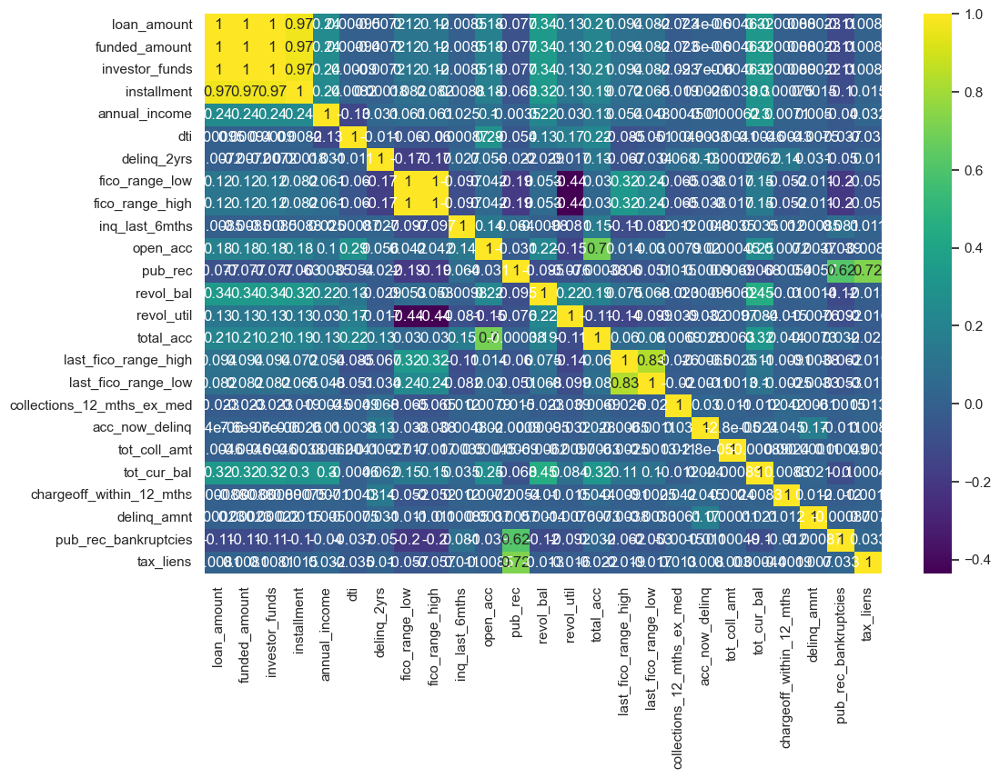

In [89]:
#더미변수 제외하고 확인하기
plt.figure(figsize=(12, 8))
sns.heatmap(df_corr.corr(), annot=True, cmap='viridis')

In [90]:
df_corr.corr()

,loan_amount,funded_amount,investor_funds,installment,annual_income,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
loan_amount,1.00,1.00,1.00,0.97,0.24,0.00,-0.01,0.12,0.12,-0.01,0.18,-0.08,0.34,0.13,0.21,0.09,0.08,-0.02,0.00,-0.00,0.32,-0.00,0.00,-0.11,0.01
funded_amount,1.00,1.00,1.00,0.97,0.24,0.00,-0.01,0.12,0.12,-0.01,0.18,-0.08,0.34,0.13,0.21,0.09,0.08,-0.02,0.00,-0.00,0.32,-0.00,0.00,-0.11,0.01
investor_funds,1.00,1.00,1.00,0.97,0.24,0.00,-0.01,0.12,0.12,-0.01,0.18,-0.08,0.34,0.13,0.21,0.09,0.08,-0.02,-0.00,-0.00,0.32,-0.00,0.00,-0.11,0.01
installment,0.97,0.97,0.97,1.00,0.24,0.01,0.00,0.08,0.08,0.01,0.18,-0.06,0.32,0.13,0.19,0.07,0.06,-0.02,0.00,-0.00,0.30,0.00,0.00,-0.10,0.01
annual_income,0.24,0.24,0.24,0.24,1.00,-0.13,0.03,0.06,0.06,0.03,0.10,-0.00,0.22,0.03,0.13,0.05,0.05,-0.00,0.01,0.00,0.30,0.01,0.01,-0.04,0.03
dti,0.00,0.00,0.00,0.01,-0.13,1.00,-0.01,-0.06,-0.06,0.00,0.29,-0.05,0.13,0.17,0.22,-0.09,-0.05,-0.00,0.00,-0.00,-0.00,-0.00,-0.01,-0.04,-0.03
delinq_2yrs,-0.01,-0.01,-0.01,0.00,0.03,-0.01,1.00,-0.17,-0.17,0.03,0.06,-0.02,-0.03,-0.02,0.13,-0.07,-0.03,0.07,0.13,-0.00,0.06,0.14,0.03,-0.05,0.01
fico_range_low,0.12,0.12,0.12,0.08,0.06,-0.06,-0.17,1.00,1.00,-0.10,0.04,-0.19,0.05,-0.44,0.03,0.32,0.24,-0.07,-0.04,-0.02,0.15,-0.05,-0.01,-0.20,-0.06
fico_range_high,0.12,0.12,0.12,0.08,0.06,-0.06,-0.17,1.00,1.00,-0.10,0.04,-0.19,0.05,-0.44,0.03,0.32,0.24,-0.07,-0.04,-0.02,0.15,-0.05,-0.01,-0.20,-0.06
inq_last_6mths,-0.01,-0.01,-0.01,0.01,0.03,0.00,0.03,-0.10,-0.10,1.00,0.14,0.06,-0.01,-0.08,0.15,-0.11,-0.08,0.01,-0.00,0.00,0.04,0.01,0.00,0.08,0.01


In [91]:
#상관관계가 높은 변수들 데이터 확인 후 제거 
df_x_y.drop(['investor_funds'], axis=1, inplace = True)

In [92]:
# FICO 점수 통합
df_x_y['fico_score'] = 0.5*df_x_y['fico_range_low'] + 0.5*df_x_y['fico_range_high']
df_x_y.drop(['fico_range_low', "fico_range_high"], axis = 1, inplace=True)

In [93]:
#last_fico_점수 생성
df_x_y['last_fico_score'] = 0.5*df_x_y['last_fico_range_low'] + 0.5*df_x_y['last_fico_range_high']
df_x_y.drop(['last_fico_range_low','last_fico_range_high'],axis=1, inplace=True)

In [94]:
#처리된 더미변수 포함해서 상관관계 확인하기
df_x_y.corr()

,loan_amount,funded_amount,interest_rate,total_pymnt,total_rec_prncp,installment,annual_income,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,home_ownership2,home_ownership3,home_ownership4,home_ownership5,home_ownership6,verification_status2,verification_status3,purpose2,purpose3,purpose4,purpose5,purpose6,purpose7,purpose8,purpose9,purpose10,purpose11,purpose12,purpose13,purpose14,addr_state2,addr_state3,addr_state4,addr_state5,addr_state6,addr_state7,addr_state8,addr_state9,addr_state10,addr_state11,addr_state12,addr_state13,addr_state14,addr_state15,addr_state16,addr_state17,addr_state18,addr_state19,addr_state20,addr_state21,addr_state22,addr_state23,addr_state24,addr_state25,addr_state26,addr_state27,addr_state28,addr_state29,addr_state30,addr_state31,addr_state32,addr_state33,addr_state34,addr_state35,addr_state36,addr_state37,addr_state38,addr_state39,addr_state40,addr_state41,addr_state42,addr_state43,addr_state44,addr_state45,addr_state46,addr_state47,addr_state48,addr_state49,addr_state50,addr_state51,term1,depvar,fico_score,last_fico_score
loan_amount,1.00,1.00,0.06,0.91,0.87,0.97,0.24,0.00,-0.01,-0.01,0.18,-0.08,0.34,0.13,0.21,-0.02,0.00,-0.00,0.32,-0.00,0.00,-0.11,0.01,0.18,0.00,-0.00,-0.03,-0.17,0.02,0.16,0.04,0.10,-0.00,-0.02,0.00,-0.05,-0.07,-0.07,-0.14,-0.01,0.01,-0.08,-0.01,-0.01,-0.01,-0.01,0.01,0.00,0.00,0.01,-0.00,-0.02,0.00,0.01,-0.00,-0.01,0.01,-0.01,-0.00,-0.01,-0.00,0.02,0.01,-0.00,-0.02,-0.01,-0.01,-0.01,-0.01,-0.01,-0.00,-0.01,0.00,0.02,-0.00,-0.01,-0.00,-0.02,-0.00,-0.01,-0.01,-0.01,-0.00,-0.00,-0.00,0.03,-0.00,0.02,-0.01,0.01,-0.01,0.00,0.00,-0.30,0.03,0.12,0.09
funded_amount,1.00,1.00,0.06,0.91,0.87,0.97,0.24,0.00,-0.01,-0.01,0.18,-0.08,0.34,0.13,0.21,-0.02,0.00,-0.00,0.32,-0.00,0.00,-0.11,0.01,0.18,0.00,-0.00,-0.03,-0.17,0.02,0.16,0.04,0.10,-0.00,-0.02,0.00,-0.05,-0.07,-0.07,-0.14,-0.01,0.01,-0.08,-0.01,-0.01,-0.01,-0.01,0.01,0.00,0.00,0.01,-0.00,-0.02,0.00,0.01,-0.00,-0.01,0.01,-0.01,-0.00,-0.01,-0.00,0.02,0.01,-0.00,-0.02,-0.01,-0.01,-0.01,-0.01,-0.01,-0.00,-0.01,0.00,0.02,-0.00,-0.01,-0.00,-0.02,-0.00,-0.01,-0.01,-0.01,-0.00,-0.00,-0.00,0.03,-0.00,0.02,-0.01,0.01,-0.01,0.00,0.00,-0.30,0.03,0.12,0.09
interest_rate,0.06,0.06,1.00,0.08,-0.05,0.09,-0.08,0.17,0.04,0.25,-0.04,0.05,-0.06,0.25,-0.07,0.01,0.02,0.00,-0.11,0.01,0.00,0.05,0.01,-0.09,0.00,0.00,0.00,0.09,0.00,0.22,-0.18,0.08,-0.00,-0.03,0.05,-0.01,0.03,0.05,0.10,0.02,0.08,0.02,0.03,0.01,0.01,-0.00,-0.00,-0.01,-0.00,-0.01,0.00,0.01,0.00,0.01,0.00,-0.00,-0.01,0.00,-0.00,0.00,0.00,-0.02,0.00,-0.01,0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.01,-0.00,0.00,0.01,0.01,0.00,0.01,-0.00,0.00,-0.00,0.01,0.00,0.01,-0.01,0.00,-0.00,-0.00,0.00,-0.01,0.00,0.00,-0.37,0.22,-0.41,-0.30
total_pymnt,0.91,0.91,0.08,1.00,0.97,0.87,0.22,-0.00,-0.01,-0.02,0.16,-0.08,0.31,0.14,0.19,-0.02,0.00,-0.00,0.30,-0.00,-0.00,-0.11,0.01,0.18,0.00,0.00,-0.03,-0.16,0.01,0.16,0.04,0.10,-0.00,-0.02,0.00,-0.05,-0.07,-0.06,-0.12,-0.01,0.01,-0.07,-0.01,-0.01,-0.01,-0.01,0.01,0.01,0.01,0.01,-0.00,-0.03,0.01,0.01,-0.00,-0.01,0.02,-0.01,0.00,-0.01,-0.00,0.02,0.01,-0.00,-0.01,-0.01,-0.01,-0.01,-0.01,-0.01,-0.00,-0.01,0.00,0.02,-0.00,-0.01,-0.00,-0.01,-0.00,-0.01,-0.01,-0.00,0.00,-0.00,-0.00,0.02,-0.00,0.02,-0.00,0.01,-0.01,0.00,0.01,-0.32,-0.25,0.11,0.22
total_rec_prncp,0.87,0.87,-0.05,0.97,1.00,0.85,0.23,-0.03,-0.01,-0.04,0.16,-0.08,0.32,0.09,0.19,-0.02,-0.00,-0.00,0.31,-0.00,-0.00,-0.11,0.01,0.18,0.00,-0.00,-0.02,-0.17,0.01,0.12,0.06,0.08,-0.00,-0.02,-0.00,-0.05,-0.07,-0.06,-0.13,-0.01,0.00,-0.07,-0.01,-0.01,-0.01,-0.01,0.01,0.01,0.01,0.01,-0.00,-0.03,0.01,0.01,-0.00,-0.01,0.02,-0.01,0.00,-0.01,-0.01,0.02,0.01,-0.00,-0.01,-0.01,-0.01,-0.01,-0.01,-0.01,-0.00,-0.01,0.00,0.02,-0.00,-0.01,-0.01,-0.02,-0.01,-0.01,-0.01,-0.00,0.00,-0.00,-0.00,0.02,-0.00,0.02,-0.00,0.01,-0.00,0.00,0.00,-0.20,-0.36,0.16,0.29
installment,0.

# 이상치 제거

In [95]:
df_x_y

,loan_amount,funded_amount,interest_rate,total_pymnt,total_rec_prncp,installment,annual_income,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,home_ownership2,home_ownership3,home_ownership4,home_ownership5,home_ownership6,verification_status2,verification_status3,purpose2,purpose3,purpose4,purpose5,purpose6,purpose7,purpose8,purpose9,purpose10,purpose11,purpose12,purpose13,purpose14,addr_state2,addr_state3,addr_state4,addr_state5,addr_state6,addr_state7,addr_state8,addr_state9,addr_state10,addr_state11,addr_state12,addr_state13,addr_state14,addr_state15,addr_state16,addr_state17,addr_state18,addr_state19,addr_state20,addr_state21,addr_state22,addr_state23,addr_state24,addr_state25,addr_state26,addr_state27,addr_state28,addr_state29,addr_state30,addr_state31,addr_state32,addr_state33,addr_state34,addr_state35,addr_state36,addr_state37,addr_state38,addr_state39,addr_state40,addr_state41,addr_state42,addr_state43,addr_state44,addr_state45,addr_state46,addr_state47,addr_state48,addr_state49,addr_state50,addr_state51,term1,depvar,emp_length,mths_since_last_delinq,mths_since_last_major_derog,mths_since_last_record,mths_since_rcnt_il,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,fico_score,last_fico_score
0,12000,12000,0.08,9735.81,5646.56,375.43,90641.00,10.20,0,1,5,0,5673,0.41,20,0,0,0,27898.00,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,2,6,4,1,1,10,1,2,1,692.00,582.00
1,14000,14000,0.11,16376.89,14000.00,461.47,46000.00,17.40,1,0,9,0,10285,0.66,18,0,0,0,19286.00,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,5,1,1,6,9,7,7,5,672.00,722.00
2,24000,24000,0.11,28435.24,24000.00,791.09,90000.00,11.73,2,0,6,0,18989,0.47,10,0,0,0,324923.00,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,6,3,2,1,9,2,1,3,1,662.00,682.00
3,14000,14000,0.09,16034.23,14000.00,448.40,115000.00,7.31,0,1,16,0,16451,0.40,22,0,0,250,16451.00,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,5,1,1,1,3,6,1,2,1,662.00,637.00
4,14000,14000,0.10,14954.26,14000.00,451.68,78000.00,24.32,0,2,17,0,25930,0.53,30,0,0,0,105053.00,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,4,10,1,1,1,6,1,2,1,687.00,707.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
874330,32000,32000,0.19,40999.67,32000.00,825.71,90000.00,27.39,0,0,14,0,91190,0.81,17,0,0,0,182697.00,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,1,1,1,1,6,1,1,1,737.00,697.00
874331,24000,24000,0.07,26627.74,24000.00,740.18,76000.00,34.20,0,0,16,0,38338,0.84,24,0,0,320,69905.00,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,12,1,1,1,1,10,1,1,1,687.00,662.00
874332,4000,4000,0.07,4361.03,4000.00,122.82,24960.00,25.29,0,2,15,0,3397,0.09,26,0,0,0,14190.00,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

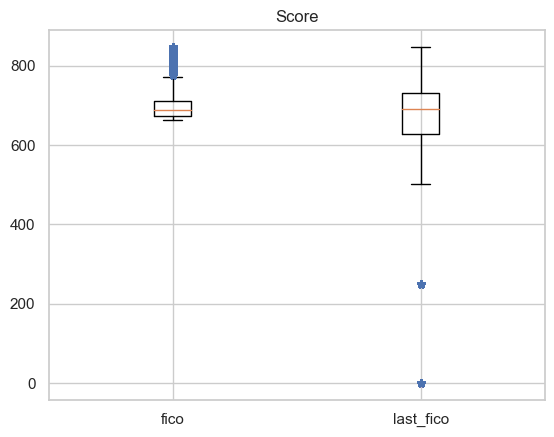

In [96]:
#이상치 확인
import matplotlib.font_manager as fm

fig, ax = plt.subplots()
ax.boxplot([df_x_y['fico_score'], df_x_y['last_fico_score']], sym="b*")
plt.title('Score')
plt.xticks([1, 2],
           ['fico','last_fico'])

plt.show()

In [97]:
#FICO점수는 300점~850점 사이!
df_outlier = df_x_y[df_x_y["fico_score"] > 0]
df_outlier = df_x_y[df_x_y["last_fico_score"] >=300]

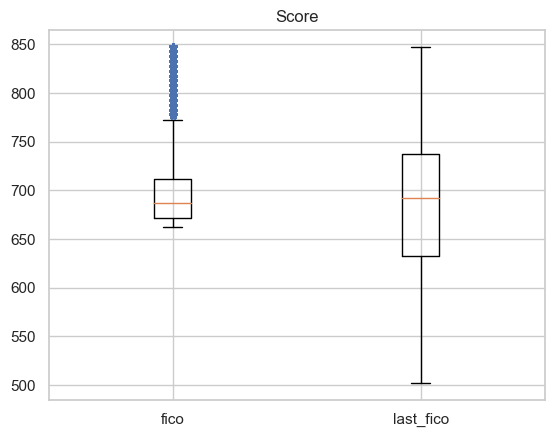

In [98]:
#이상치 제거 확인
import matplotlib.font_manager as fm

fig, ax = plt.subplots()
ax.boxplot([df_outlier['fico_score'], df_outlier['last_fico_score']], sym="b*")
plt.title('Score')
plt.xticks([1, 2],
           ['fico','last_fico'])

plt.show()

In [99]:
df_outlier.describe()

,loan_amount,funded_amount,interest_rate,total_pymnt,total_rec_prncp,installment,annual_income,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,home_ownership2,home_ownership3,home_ownership4,home_ownership5,home_ownership6,verification_status2,verification_status3,purpose2,purpose3,purpose4,purpose5,purpose6,purpose7,purpose8,purpose9,purpose10,purpose11,purpose12,purpose13,purpose14,addr_state2,addr_state3,addr_state4,addr_state5,addr_state6,addr_state7,addr_state8,addr_state9,addr_state10,addr_state11,addr_state12,addr_state13,addr_state14,addr_state15,addr_state16,addr_state17,addr_state18,addr_state19,addr_state20,addr_state21,addr_state22,addr_state23,addr_state24,addr_state25,addr_state26,addr_state27,addr_state28,addr_state29,addr_state30,addr_state31,addr_state32,addr_state33,addr_state34,addr_state35,addr_state36,addr_state37,addr_state38,addr_state39,addr_state40,addr_state41,addr_state42,addr_state43,addr_state44,addr_state45,addr_state46,addr_state47,addr_state48,addr_state49,addr_state50,addr_state51,term1,depvar,fico_score,last_fico_score
count,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00,853285.00
mean,13696.46,13696.43,0.13,15039.64,12368.56,432.58,76030.31,18.18,0.34,0.64,11.61,0.23,16450.14,0.53,24.86,0.02,0.01,250.65,136498.87,0.01,16.38,0.13,0.06,0.49,0.00,0.00,0.11,0.40,0.39,0.28,0.23,0.58,0.00,0.06,0.00,0.02,0.01,0.01,0.06,0.00,0.01,0.01,0.00,0.01,0.01,0.02,0.14,0.02,0.02,0.00,0.00,0.07,0.03,0.01,0.00,0.00,0.04,0.02,0.01,0.01,0.01,0.02,0.02,0.00,0.03,0.02,0.02,0.01,0.00,0.03,0.00,0.00,0.00,0.04,0.01,0.01,0.08,0.03,0.01,0.01,0.03,0.00,0.01,0.00,0.02,0.08,0.01,0.03,0.00,0.02,0.01,0.00,0.00,0.87,0.15,696.55,681.52
std,8458.48,8458.46,0.04,10308.43,8515.81,265.72,95851.52,8.31,0.91,0.93,5.43,0.63,22769.59,0.24,11.86,0.15,0.08,10155.84,155990.54,0.11,838.41,0.38,0.43,0.50,0.01,0.01,0.31,0.49,0.49,0.45,0.42,0.49,0.00,0.24,0.06,0.14,0.11,0.08,0.23,0.03,0.10,0.08,0.03,0.11,0.09,0.15,0.35,0.14,0.12,0.05,0.05,0.26,0.18,0.07,0.00,0.03,0.20,0.13,0.09,0.10,0.11,0.15,0.15,0.04,0.16,0.13,0.12,0.07,0.05,0.16,0.03,0.05,0.07,0.19,0.07,0.12,0.28,0.18,0.09,0.11,0.18,0.07,0.11,0.05,0.12,0.28,0.08,0.16,0.05,0.14,0.11,0.06,0.05,0.33,0.35,30.74,76.72
min,1000.00,1000.00,0.05,0.00,0.00,14.01,3000.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,2.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,662.00,502.00
25%,7200.00,7200.00,0.09,7173.24,6000.00,237.52,45000.00,11.93,0.00,0.00,8.00,0.00,6100.00,0.35,16.00,0.00,0.00,0.00,28101.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0

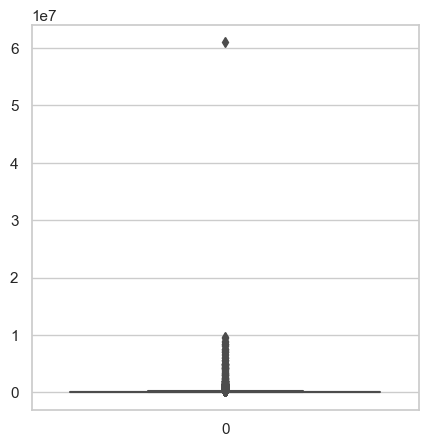

In [100]:
#연수익
plt.figure(figsize=(5,5))
sns.boxplot(data=df_outlier['annual_income'], color = 'blue')
plt.show()

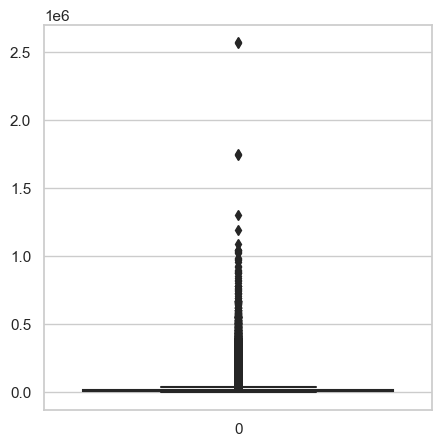

In [101]:
#revol_bal
plt.figure(figsize=(5,5))
sns.boxplot(data=df_outlier['revol_bal'], color = 'green')
plt.show()

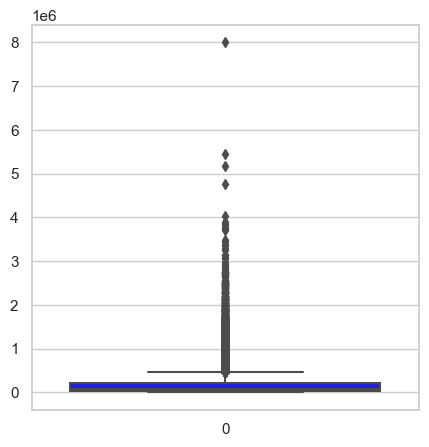

In [102]:
#tot_cur_bal

plt.figure(figsize=(5,5))
sns.boxplot(data=df_outlier['tot_cur_bal'], color = 'blue')
plt.show()

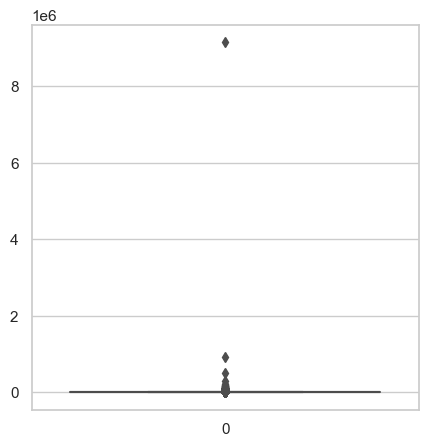

In [103]:
#tot_coll_amt

plt.figure(figsize=(5,5))
sns.boxplot(data=df_outlier['tot_coll_amt'], color = 'gray')
plt.show()

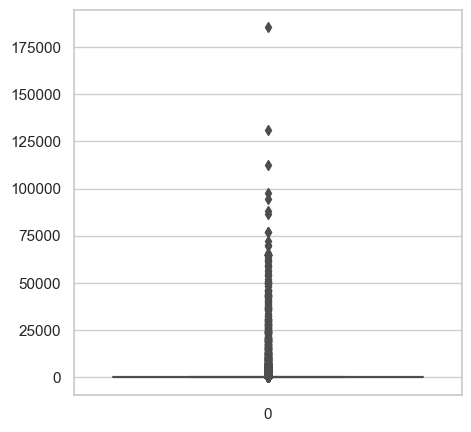

In [104]:
# delinq_amnt
plt.figure(figsize=(5,5))
sns.boxplot(data=df_outlier['delinq_amnt'], color = 'gray')
plt.show()

In [105]:
df_outlier['delinq_amnt'].value_counts()

0        849666
65000        59
25           52
30           43
53           42
          ...  
993           1
872           1
2382          1
6281          1
10525         1
Name: delinq_amnt, Length: 1576, dtype: int64

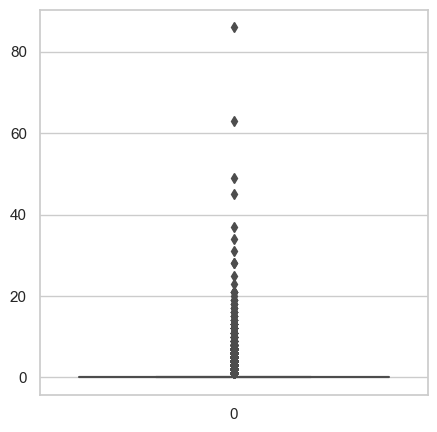

In [106]:
# pub_rec
plt.figure(figsize=(5,5))
sns.boxplot(data=df_outlier['pub_rec'], color = 'gray')
plt.show()

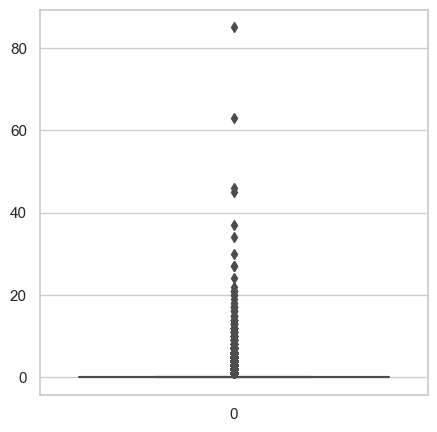

In [107]:
# tax_liens
plt.figure(figsize=(5,5))
sns.boxplot(data=df_outlier['tax_liens'], color = 'gray')
plt.show()

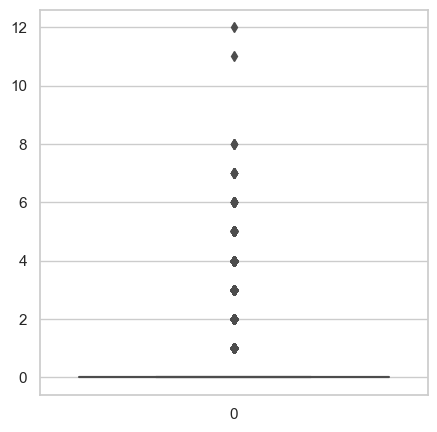

In [108]:
# pub_rec_bankruptcies
plt.figure(figsize=(5,5))
sns.boxplot(data=df_outlier['pub_rec_bankruptcies'], color = 'gray')
plt.show()

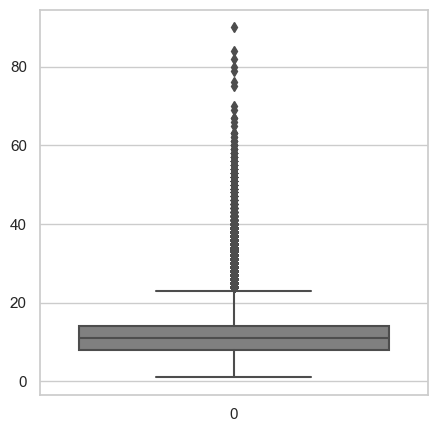

In [109]:
# open_acc
plt.figure(figsize=(5,5))
sns.boxplot(data=df_outlier['open_acc'], color = 'gray')
plt.show()

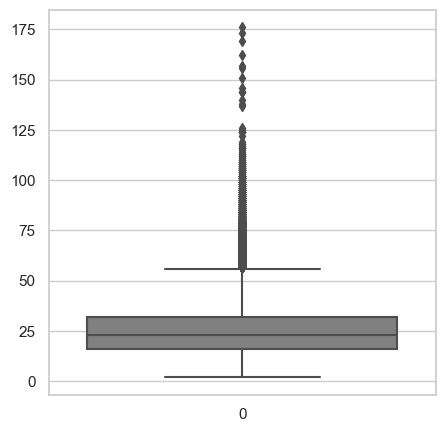

In [110]:
# total_acc
plt.figure(figsize=(5,5))
sns.boxplot(data=df_outlier['total_acc'], color = 'gray')
plt.show()

In [111]:
#IQR로 제거하기

#def remove_outlier(x):
#    q1=x.quantile(0.25)
#    q2=x.quantile(0.5)
#    q3=x.quantile(0.75)
#    iqr=q3-q1
#    df_x_y_iqr=x>q3+1.5*iqr
#    df_outlier = x[df_x_y_iqr].index.to_list()
#    return df_outlier

In [112]:
#df_outlier.iloc[0]

In [113]:
#이상치 행들을 list set
#lst = list(set(remove_outlier(df_outlier['annual_income'])) | set(remove_outlier(df_outlier['revol_bal'])) | set(remove_outlier(df_outlier['tot_cur_bal'])) | set(remove_outlier(df_outlier['tot_coll_amt']))|set(remove_outlier(df_outlier['delinq_amnt'])) | set(remove_outlier(df_outlier['pub_rec'])) | set(remove_outlier(df_outlier['tax_liens']))|set(remove_outlier(df_outlier['pub_rec_bankruptcies'])) | set(remove_outlier(df_outlier['open_acc']))|set(remove_outlier(df_outlier['total_acc'])))

In [114]:
# IQR로 했을 때 데이터 손실이 너무 큼 -> 87만개에서 9194개로 줄어듦
#df_outlier = df_outlier[~df_outlier.isin(lst).any(axis=1)]
#df_outlier

In [115]:
#따라서 Isolation Forest 머신러닝으로 이상치 예측
from sklearn.ensemble import IsolationForest

iso = IsolationForest(n_estimators=100, max_samples='auto', contamination=float(0.1), random_state=42)

iso.fit(df_outlier)

y_pred = iso.predict(df_outlier)

df_filtered = df_outlier[y_pred == 1]

print("Number of inliers: ", len(df_filtered))
print("Number of outliers: ", len(df_outlier) - len(df_filtered))

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Number of inliers:  767956
Number of outliers:  85329


In [116]:
df_filtered

,loan_amount,funded_amount,interest_rate,total_pymnt,total_rec_prncp,installment,annual_income,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,home_ownership2,home_ownership3,home_ownership4,home_ownership5,home_ownership6,verification_status2,verification_status3,purpose2,purpose3,purpose4,purpose5,purpose6,purpose7,purpose8,purpose9,purpose10,purpose11,purpose12,purpose13,purpose14,addr_state2,addr_state3,addr_state4,addr_state5,addr_state6,addr_state7,addr_state8,addr_state9,addr_state10,addr_state11,addr_state12,addr_state13,addr_state14,addr_state15,addr_state16,addr_state17,addr_state18,addr_state19,addr_state20,addr_state21,addr_state22,addr_state23,addr_state24,addr_state25,addr_state26,addr_state27,addr_state28,addr_state29,addr_state30,addr_state31,addr_state32,addr_state33,addr_state34,addr_state35,addr_state36,addr_state37,addr_state38,addr_state39,addr_state40,addr_state41,addr_state42,addr_state43,addr_state44,addr_state45,addr_state46,addr_state47,addr_state48,addr_state49,addr_state50,addr_state51,term1,depvar,emp_length,mths_since_last_delinq,mths_since_last_major_derog,mths_since_last_record,mths_since_rcnt_il,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,fico_score,last_fico_score
0,12000,12000,0.08,9735.81,5646.56,375.43,90641.00,10.20,0,1,5,0,5673,0.41,20,0,0,0,27898.00,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,2,6,4,1,1,10,1,2,1,692.00,582.00
1,14000,14000,0.11,16376.89,14000.00,461.47,46000.00,17.40,1,0,9,0,10285,0.66,18,0,0,0,19286.00,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,5,1,1,6,9,7,7,5,672.00,722.00
2,24000,24000,0.11,28435.24,24000.00,791.09,90000.00,11.73,2,0,6,0,18989,0.47,10,0,0,0,324923.00,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,6,3,2,1,9,2,1,3,1,662.00,682.00
3,14000,14000,0.09,16034.23,14000.00,448.40,115000.00,7.31,0,1,16,0,16451,0.40,22,0,0,250,16451.00,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,5,1,1,1,3,6,1,2,1,662.00,637.00
4,14000,14000,0.10,14954.26,14000.00,451.68,78000.00,24.32,0,2,17,0,25930,0.53,30,0,0,0,105053.00,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,4,10,1,1,1,6,1,2,1,687.00,707.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
874330,32000,32000,0.19,40999.67,32000.00,825.71,90000.00,27.39,0,0,14,0,91190,0.81,17,0,0,0,182697.00,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,1,1,1,1,6,1,1,1,737.00,697.00
874331,24000,24000,0.07,26627.74,24000.00,740.18,76000.00,34.20,0,0,16,0,38338,0.84,24,0,0,320,69905.00,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,12,1,1,1,1,10,1,1,1,687.00,662.00
874332,4000,4000,0.07,4361.03,4000.00,122.82,24960.00,25.29,0,2,15,0,3397,0.09,26,0,0,0,14190.00,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

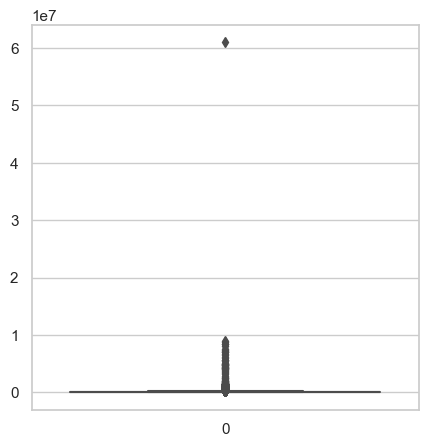

In [117]:
#연수익
plt.figure(figsize=(5,5))
sns.boxplot(data=df_filtered['annual_income'], color = 'blue')
plt.show()

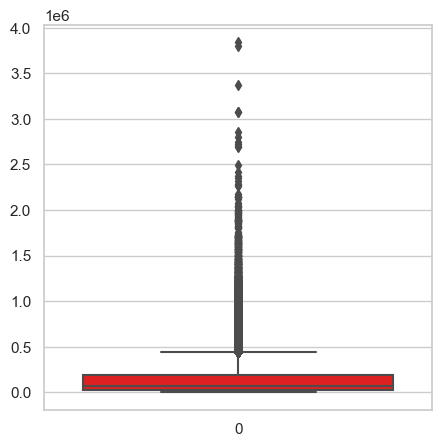

In [118]:
#총신용회전잔액
plt.figure(figsize=(5,5))
sns.boxplot(data=df_filtered['tot_cur_bal'], color = 'red')
plt.show()

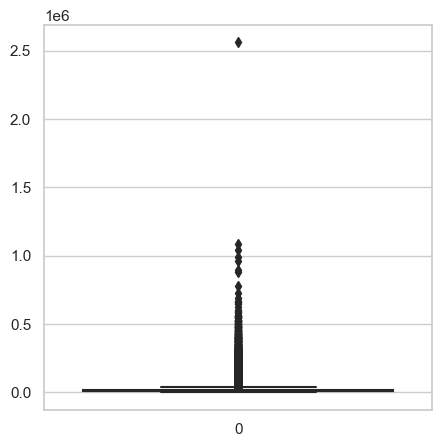

In [119]:
#총경상잔고
plt.figure(figsize=(5,5))
sns.boxplot(data=df_filtered['revol_bal'], color = 'green')
plt.show()

#데이터의 이상치 제거 예측도는 낮았음의 한계를 확인할 수 있었음

# 데이터 정규화

In [120]:
#데이터 정규화를 위해 string에서 float로 변환
df_filtered_float = df_filtered.astype(float)

In [121]:
df_filtered_float

,loan_amount,funded_amount,interest_rate,total_pymnt,total_rec_prncp,installment,annual_income,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,home_ownership2,home_ownership3,home_ownership4,home_ownership5,home_ownership6,verification_status2,verification_status3,purpose2,purpose3,purpose4,purpose5,purpose6,purpose7,purpose8,purpose9,purpose10,purpose11,purpose12,purpose13,purpose14,addr_state2,addr_state3,addr_state4,addr_state5,addr_state6,addr_state7,addr_state8,addr_state9,addr_state10,addr_state11,addr_state12,addr_state13,addr_state14,addr_state15,addr_state16,addr_state17,addr_state18,addr_state19,addr_state20,addr_state21,addr_state22,addr_state23,addr_state24,addr_state25,addr_state26,addr_state27,addr_state28,addr_state29,addr_state30,addr_state31,addr_state32,addr_state33,addr_state34,addr_state35,addr_state36,addr_state37,addr_state38,addr_state39,addr_state40,addr_state41,addr_state42,addr_state43,addr_state44,addr_state45,addr_state46,addr_state47,addr_state48,addr_state49,addr_state50,addr_state51,term1,depvar,emp_length,mths_since_last_delinq,mths_since_last_major_derog,mths_since_last_record,mths_since_rcnt_il,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,fico_score,last_fico_score
0,12000.00,12000.00,0.08,9735.81,5646.56,375.43,90641.00,10.20,0.00,1.00,5.00,0.00,5673.00,0.41,20.00,0.00,0.00,0.00,27898.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,2.00,6.00,4.00,1.00,1.00,10.00,1.00,2.00,1.00,692.00,582.00
1,14000.00,14000.00,0.11,16376.89,14000.00,461.47,46000.00,17.40,1.00,0.00,9.00,0.00,10285.00,0.66,18.00,0.00,0.00,0.00,19286.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,2.00,5.00,1.00,1.00,6.00,9.00,7.00,7.00,5.00,672.00,722.00
2,24000.00,24000.00,0.11,28435.24,24000.00,791.09,90000.00,11.73,2.00,0.00,6.00,0.00,18989.00,0.47,10.00,0.00,0.00,0.00,324923.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,6.00,3.00,2.00,1.00,9.00,2.00,1.00,3.00,1.00,662.00,682.00
3,14000.00,14000.00,0.09,16034.23,14000.00,448.40,115000.00,7.31,0.00,1.00,16.00,0.00,16451.00,0.40,22.00,0.00,0.00,250.00,16451.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,5.00,1.00,1.00,1.00,3.00,6.00,1.00,2.00,1.00,662.00,637.00
4,14000.00,14000.00,0.10,14954.26,14000.00,451.68,78000.00,24.32,0.00,2.00,17.00,0.00,25930.00,0.53,30.00,0.00,0.00,0.00,105053.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.

In [122]:
df_new = (df_filtered_float - df_filtered_float.min())/(df_filtered_float.max() - df_filtered_float.min())
df_new

,loan_amount,funded_amount,interest_rate,total_pymnt,total_rec_prncp,installment,annual_income,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,home_ownership2,home_ownership3,home_ownership4,home_ownership5,home_ownership6,verification_status2,verification_status3,purpose2,purpose3,purpose4,purpose5,purpose6,purpose7,purpose8,purpose9,purpose10,purpose11,purpose12,purpose13,purpose14,addr_state2,addr_state3,addr_state4,addr_state5,addr_state6,addr_state7,addr_state8,addr_state9,addr_state10,addr_state11,addr_state12,addr_state13,addr_state14,addr_state15,addr_state16,addr_state17,addr_state18,addr_state19,addr_state20,addr_state21,addr_state22,addr_state23,addr_state24,addr_state25,addr_state26,addr_state27,addr_state28,addr_state29,addr_state30,addr_state31,addr_state32,addr_state33,addr_state34,addr_state35,addr_state36,addr_state37,addr_state38,addr_state39,addr_state40,addr_state41,addr_state42,addr_state43,addr_state44,addr_state45,addr_state46,addr_state47,addr_state48,addr_state49,addr_state50,addr_state51,term1,depvar,emp_length,mths_since_last_delinq,mths_since_last_major_derog,mths_since_last_record,mths_since_rcnt_il,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,fico_score,last_fico_score
0,0.28,0.28,0.10,0.16,0.14,0.23,0.00,0.20,0.00,0.12,0.05,0.00,0.00,0.05,0.11,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.09,0.50,0.30,0.00,0.00,0.90,0.00,0.11,0.00,0.16,0.23
1,0.33,0.33,0.24,0.26,0.35,0.29,0.00,0.35,0.03,0.00,0.10,0.00,0.00,0.07,0.09,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.09,0.40,0.00,0.00,0.50,0.80,0.60,0.67,0.40,0.05,0.64
2,0.59,0.59,0.24,0.45,0.60,0.50,0.00,0.23,0.07,0.00,0.06,0.00,0.01,0.05,0.05,0.00,0.00,0.00,0.08,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.45,0.20,0.10,0.00,0.80,0.10,0.00,0.22,0.00,0.00,0.52
3,0.33,0.33,0.16,0.26,0.35,0.28,0.00,0.15,0.00,0.12,0.19,0.00,0.01,0.04,0.12,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.36,0.00,0.00,0.00,0.20,0.50,0.00,0.11,0.00,0.00,0.39
4,0.33,0.33,0.18,0.24,0.35,0.28,0.00,0.49,0.00,0.25,0.20,0.00,0.01,0.06,0.16,0.00,0.00,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.

In [123]:
df_filtered_float.drop(['last_fico_score'],axis=1, inplace=True)

In [124]:
df_new.drop(['last_fico_score'],axis=1, inplace=True)

# 이상치 제거 및 정규화 데이터 CSV파일로 저장

In [125]:
df_filtered_float.to_csv("lending club_undummies_outlier.csv", index = False)

In [126]:
df_new.to_csv("lending club_scailing.csv", index = False)